<a href="https://colab.research.google.com/github/LaraV15/Computer-Vision/blob/main/dataset_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.8/898.8 kB 25.2 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO
import os
import matplotlib.pyplot as plt
import numpy as np
import kagglehub
import glob
import random
import shutil
import yaml
import locale

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
# rm -r /content/Computer-Vision

In [ ]:
!git clone https://github.com/LaraV15/Computer-Vision

Cloning into 'Computer-Vision'...
remote: Enumerating objects: 2306, done.
remote: Total 2306 (delta 0), reused 0 (delta 0), pack-reused 2306 (from 1)
Receiving objects: 100% (2306/2306), 54.91 MiB | 28.82 MiB/s, done.
Resolving deltas: 100% (3/3), done.


In [ ]:
train_dir = "https://github.com/LaraV15/Computer-Vision/tree/main/train"
test_dir = "https://github.com/LaraV15/Computer-Vision/tree/main/test"
valid_dir = "https://github.com/LaraV15/Computer-Vision/tree/main/test"

In [ ]:
# Define la ruta a la carpeta de etiquetas (labels) dentro del directorio de entrenamiento
train_labels_dir = '/content/Computer-Vision/train/labels'

# Función para contar las clases en los archivos .txt
def count_classes_in_labels(labels_dir):
    class_counts = {}

    # Recorre todos los archivos en el directorio de etiquetas
    for label_file in os.listdir(labels_dir):
        # Verifica si es un archivo .txt
        if label_file.endswith('.txt'):
            # Extrae la clase del nombre del archivo (antes de "_0_jpg.rf")
            class_name = label_file.split('_')[0]  # Asume que la clase está antes del primer "_"

            # Incrementa el contador para esa clase
            if class_name in class_counts:
                class_counts[class_name] += 1
            else:
                class_counts[class_name] = 1

    return class_counts

# Función para analizar el balance de clases
def analyze_class_balance(class_counts):
    total_images = sum(class_counts.values())
    print("Total de imágenes:", total_images)

    # Calcula y muestra el porcentaje de cada clase
    for class_name, count in class_counts.items():
        percentage = (count / total_images) * 100
        print(f"Clase {class_name}: {count} imágenes ({percentage:.2f}%)")

    # Detecta si las clases están balanceadas
    # En este caso, consideraremos balanceadas si la diferencia en porcentaje no es mayor al 10%
    min_count = min(class_counts.values())
    max_count = max(class_counts.values())
    balance_threshold = 10  # umbral de diferencia de porcentaje
    if ((max_count - min_count) / total_images) * 100 > balance_threshold:
        print("\nLas clases no están balanceadas.")
    else:
        print("\nLas clases están balanceadas.")

# Ejecuta el análisis
class_counts = count_classes_in_labels(train_labels_dir)
analyze_class_balance(class_counts)


Total de imágenes: 999
Clase Letra-A: 45 imágenes (4.50%)
Clase Letra-Q: 33 imágenes (3.30%)
Clase Letra-V: 48 imágenes (4.80%)
Clase Letra-E: 48 imágenes (4.80%)
Clase Letra-D: 39 imágenes (3.90%)
Clase Letra-B: 36 imágenes (3.60%)
Clase Letra-G: 42 imágenes (4.20%)
Clase Letra-U: 42 imágenes (4.20%)
Clase Letra-Y: 27 imágenes (2.70%)
Clase Letra-T: 54 imágenes (5.41%)
Clase Letra-W: 42 imágenes (4.20%)
Clase Letra-S: 39 imágenes (3.90%)
Clase Letra-P: 48 imágenes (4.80%)
Clase Letra-H: 45 imágenes (4.50%)
Clase Letra-N: 48 imágenes (4.80%)
Clase Letra-R: 42 imágenes (4.20%)
Clase Letra-C: 42 imágenes (4.20%)
Clase Letra-I: 42 imágenes (4.20%)
Clase Letra-O: 45 imágenes (4.50%)
Clase Letra-X: 36 imágenes (3.60%)
Clase Letra-K: 36 imágenes (3.60%)
Clase Letra-F: 39 imágenes (3.90%)
Clase Letra-L: 42 imágenes (4.20%)
Clase Letra-M: 39 imágenes (3.90%)

Las clases están balanceadas.


In [ ]:
len(class_counts)

24

In [ ]:
# Definir las rutas de las carpetas de imágenes
train_images_dir = '/content/Computer-Vision/train/images'
val_images_dir = '/content/Computer-Vision/valid/images'

# Definir el número de clases y los nombres de las clases
classes = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y']
nc = len(classes)

# Crear el diccionario con la configuración
data = {
    'train': train_images_dir,  # Ruta a las imágenes de entrenamiento
    'val': val_images_dir,      # Ruta a las imágenes de validación
    'nc': nc,                   # Número de clases
    'names': classes            # Lista de nombres de las clases
}

# Guardar el archivo YAML
yaml_file = 'señas.yaml'
with open(yaml_file, 'w') as file:
    yaml.dump(data, file, default_flow_style=False)

print(f"Archivo {yaml_file} generado exitosamente.")


Archivo señas.yaml generado exitosamente.


In [ ]:
# Cargar el archivo YAML
yaml_file = 'señas.yaml'

with open(yaml_file, 'r') as file:
    data = yaml.safe_load(file)

# Mostrar el contenido
print(yaml.dump(data, default_flow_style=False))


names:
- A
- B
- C
- D
- E
- F
- G
- H
- I
- K
- L
- M
- N
- O
- P
- Q
- R
- S
- T
- U
- V
- W
- X
- Y
nc: 24
train: /content/Computer-Vision/train/images
val: /content/Computer-Vision/valid/images



In [ ]:
# Define el archivo YAML de configuración
yaml_file = 'señas.yaml'

# Cargar el modelo preentrenado y configurarlo
model = YOLO('yolov5s.pt')  # Cargar el modelo base YOLOv5 pequeño

# Entrenar el modelo con los parámetros especificados
model.train(data=yaml_file, epochs=20)

# Guardar el modelo entrenado si es necesario
model.save()  # Guardará el modelo final entrenado en el directorio 'runs/train/exp'


PRO TIP 💡 Replace 'model=yolov5s.pt' with new 'model=yolov5su.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



100%|██████████| 17.7M/17.7M [00:00<00:00, 236MB/s]


Ultralytics 8.3.47 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov5s.pt, data=señas.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_widt

100%|██████████| 755k/755k [00:00<00:00, 26.4MB/s]


Overriding model.yaml nc=80 with nc=24

                   from  n    params  module                                       arguments                     
  0                  -1  1      3520  ultralytics.nn.modules.conv.Conv             [3, 32, 6, 2, 2]              
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     18816  ultralytics.nn.modules.block.C3              [64, 64, 1]                   
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    115712  ultralytics.nn.modules.block.C3              [128, 128, 2]                 
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  3    625152  ultralytics.nn.modules.block.C3              [256, 256, 3]                 
  7                  -1  1   1180672  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 113MB/s]


AMP: checks passed ✅


train: Scanning /content/Computer-Vision/train/labels... 999 images, 0 backgrounds, 0 corrupt: 100%|██████████| 999/999 [00:00<00:00, 1953.79it/s]

train: New cache created: /content/Computer-Vision/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.22 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/Computer-Vision/valid/labels... 105 images, 0 backgrounds, 0 corrupt: 100%|██████████| 105/105 [00:00<00:00, 650.67it/s]

val: New cache created: /content/Computer-Vision/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000357, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      4.27G      1.607      4.288      1.916         18        640: 100%|██████████| 63/63 [00:26<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.42it/s]

                   all        105        105      0.447      0.509      0.439      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      4.25G      1.245      2.669      1.512         12        640: 100%|██████████| 63/63 [00:21<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.93it/s]

                   all        105        105      0.608      0.646      0.748      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      4.23G      1.218       2.09      1.452         14        640: 100%|██████████| 63/63 [00:22<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.99it/s]


                   all        105        105      0.732      0.879      0.926      0.369

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      4.23G      1.182      1.781      1.435         14        640: 100%|██████████| 63/63 [00:21<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.88it/s]

                   all        105        105      0.679       0.85      0.904      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      4.24G      1.126       1.53      1.391         18        640: 100%|██████████| 63/63 [00:20<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.07it/s]

                   all        105        105      0.821      0.876       0.99      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      4.23G      1.081      1.387      1.338         19        640: 100%|██████████| 63/63 [00:21<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.70it/s]

                   all        105        105      0.865      0.934      0.994      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      4.25G      1.046       1.28      1.337         12        640: 100%|██████████| 63/63 [00:26<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.41it/s]


                   all        105        105      0.927      0.901      0.995      0.676

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      4.23G      1.022      1.155      1.306         13        640: 100%|██████████| 63/63 [00:25<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.06it/s]

                   all        105        105      0.896      0.954      0.988      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      4.24G      1.008      1.135      1.299         10        640: 100%|██████████| 63/63 [00:22<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.34it/s]


                   all        105        105      0.932       0.97      0.995      0.691

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      4.23G     0.9586      1.028      1.262         17        640: 100%|██████████| 63/63 [00:21<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.68it/s]

                   all        105        105      0.928      0.968      0.995      0.687


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      4.25G     0.8085     0.6627      1.263          7        640: 100%|██████████| 63/63 [00:22<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.97it/s]

                   all        105        105      0.933      0.996      0.995      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      4.22G     0.7766     0.5864      1.242          7        640: 100%|██████████| 63/63 [00:21<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.12it/s]

                   all        105        105      0.965      0.979      0.995      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      4.24G     0.7409     0.5337      1.212          7        640: 100%|██████████| 63/63 [00:20<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.87it/s]

                   all        105        105      0.934      0.986      0.995      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      4.23G     0.7044     0.4904      1.181          7        640: 100%|██████████| 63/63 [00:21<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.27it/s]

                   all        105        105       0.97      0.993      0.995      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      4.24G      0.688      0.466      1.154          7        640: 100%|██████████| 63/63 [00:20<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.15it/s]

                   all        105        105      0.959      0.988      0.995      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      4.22G     0.6625     0.4377      1.136          7        640: 100%|██████████| 63/63 [00:20<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.97it/s]

                   all        105        105      0.964      0.987      0.995      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      4.24G     0.6406     0.4172      1.122          7        640: 100%|██████████| 63/63 [00:24<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.99it/s]

                   all        105        105      0.976          1      0.995      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      4.24G     0.6036     0.3845      1.082          7        640: 100%|██████████| 63/63 [00:20<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:00<00:00,  4.02it/s]

                   all        105        105      0.973      0.992      0.995      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      4.25G      0.588     0.3715      1.079          7        640: 100%|██████████| 63/63 [00:20<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.89it/s]

                   all        105        105       0.97          1      0.995      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      4.38G     0.5809     0.3631      1.058          7        640: 100%|██████████| 63/63 [00:21<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.19it/s]

                   all        105        105      0.975      0.995      0.995      0.788



20 epochs completed in 0.139 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 18.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 18.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.47 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv5s summary (fused): 193 layers, 9,120,824 parameters, 0 gradients, 23.9 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.07it/s]


                   all        105        105      0.973      0.992      0.995      0.794
                     A          4          4      0.972          1      0.995      0.768
                     B          6          6      0.993          1      0.995      0.804
                     C          4          4      0.966          1      0.995      0.774
                     D          5          5      0.977          1      0.995      0.817
                     E          2          2      0.932          1      0.995      0.796
                     F          5          5      0.973          1      0.995      0.772
                     G          4          4      0.975          1      0.995      0.789
                     H          5          5      0.976          1      0.995      0.772
                     I          5          5      0.972          1      0.995      0.837
                     K          6          6      0.981          1      0.995      0.777
                     

**Resumen:**
* Realizar predicciones:

Usa el método model.predict() para hacer predicciones sobre las imágenes de tu conjunto de test.
Muestra los resultados con results.show() o guárdalos con results.save().
* Evaluar el modelo:

Usa el método model.val() para calcular métricas de rendimiento como mAP, precisión y recall en tu conjunto de test.

In [ ]:
# Cargar el modelo entrenado (asegúrate de usar la ruta correcta a los pesos entrenados)
model = YOLO('/content/runs/detect/train/weights/best.pt')  # Ruta al modelo entrenado

# Ruta a la carpeta con las imágenes de test
test_images_dir = '/content/Computer-Vision/test'

# Realizar predicciones sobre las imágenes de test
for img_file in os.listdir(test_images_dir):
    if img_file.endswith(('.jpg', '.jpeg', '.png')):  # Verifica si es una imagen
        img_path = os.path.join(test_images_dir, img_file)

        # Realizar la predicción
        results = model.predict(img_path)

        # Mostrar el resultado
        results.show()  # Muestra la imagen con las predicciones
        results.save()  # Guarda la imagen con las predicciones en el directorio 'runs/detect/exp'


In [ ]:
# Evaluar el modelo en el conjunto de test
results = model.val(data='señas.yaml')

# Mostrar los resultados de la evaluación
print(results)


Ultralytics 8.3.47 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv5s summary (fused): 193 layers, 9,120,824 parameters, 0 gradients, 23.9 GFLOPs


val: Scanning /content/Computer-Vision/valid/labels.cache... 105 images, 0 backgrounds, 0 corrupt: 100%|██████████| 105/105 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.74it/s]


                   all        105        105      0.973      0.992      0.995      0.794
                     A          4          4      0.972          1      0.995      0.768
                     B          6          6      0.992          1      0.995      0.804
                     C          4          4      0.966          1      0.995      0.774
                     D          5          5      0.977          1      0.995      0.817
                     E          2          2      0.932          1      0.995      0.822
                     F          5          5      0.973          1      0.995      0.772
                     G          4          4      0.975          1      0.995      0.789
                     H          5          5      0.976          1      0.995      0.772
                     I          5          5      0.972          1      0.995      0.837
                     K          6          6      0.981          1      0.995      0.765
                     


image 1/1 /content/Computer-Vision/test/images/Letra-L_2_jpg.rf.b3765a8b035a3ce64db65bfd7c180d83.jpg: 640x640 1 L, 26.7ms
Speed: 16.2ms preprocess, 26.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


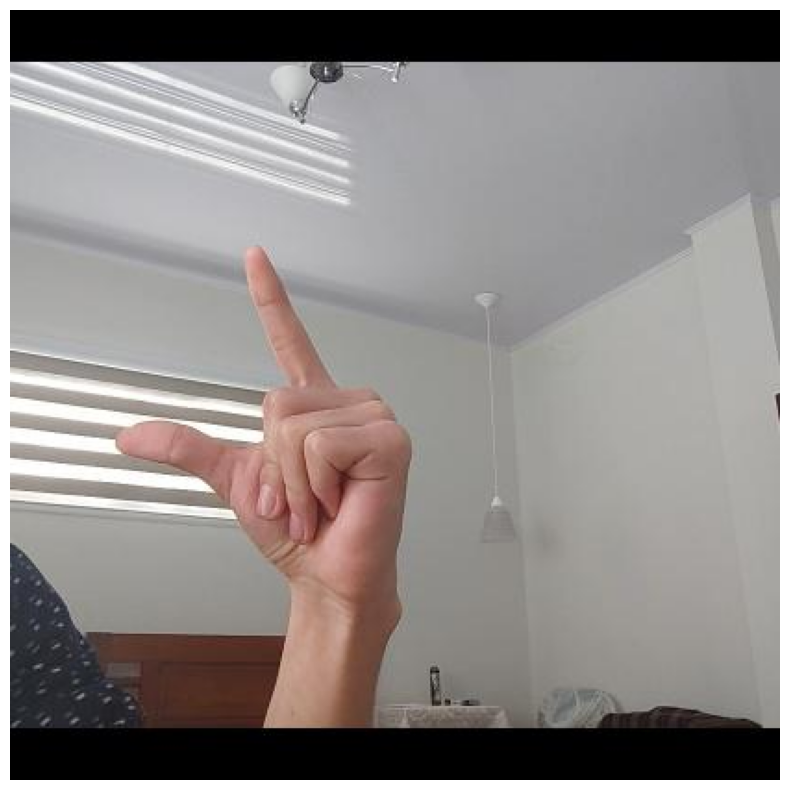


image 1/1 /content/Computer-Vision/test/images/Letra-X_17_jpg.rf.f1e59069ada4309ce6aecc4e08849519.jpg: 640x640 1 X, 14.9ms
Speed: 8.0ms preprocess, 14.9ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


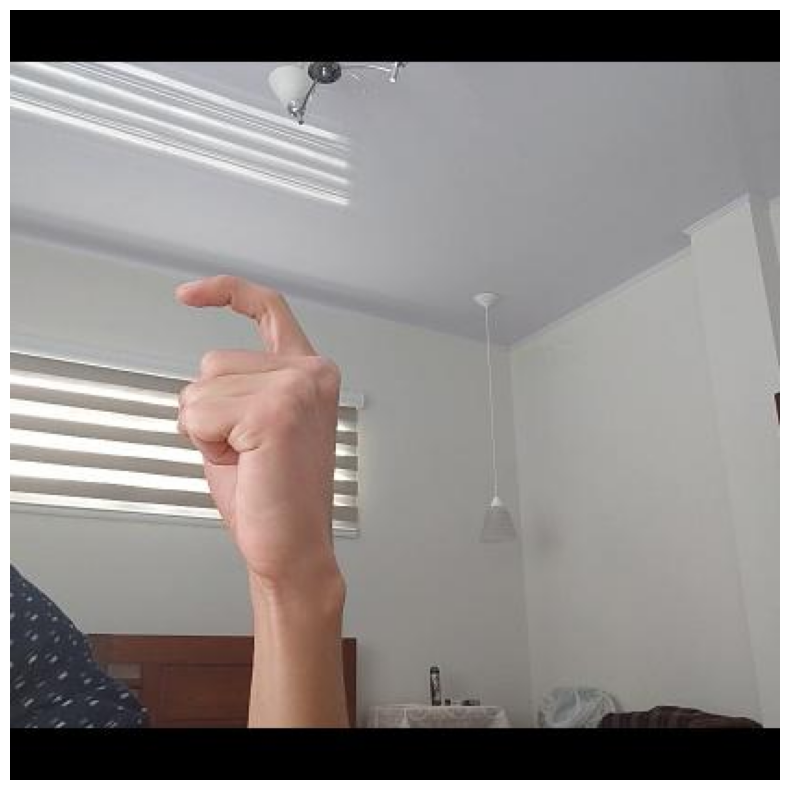


image 1/1 /content/Computer-Vision/test/images/Letra-M_2_jpg.rf.513849bcfba0b6d2f453fff57e7e0c91.jpg: 640x640 1 M, 14.9ms
Speed: 4.5ms preprocess, 14.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


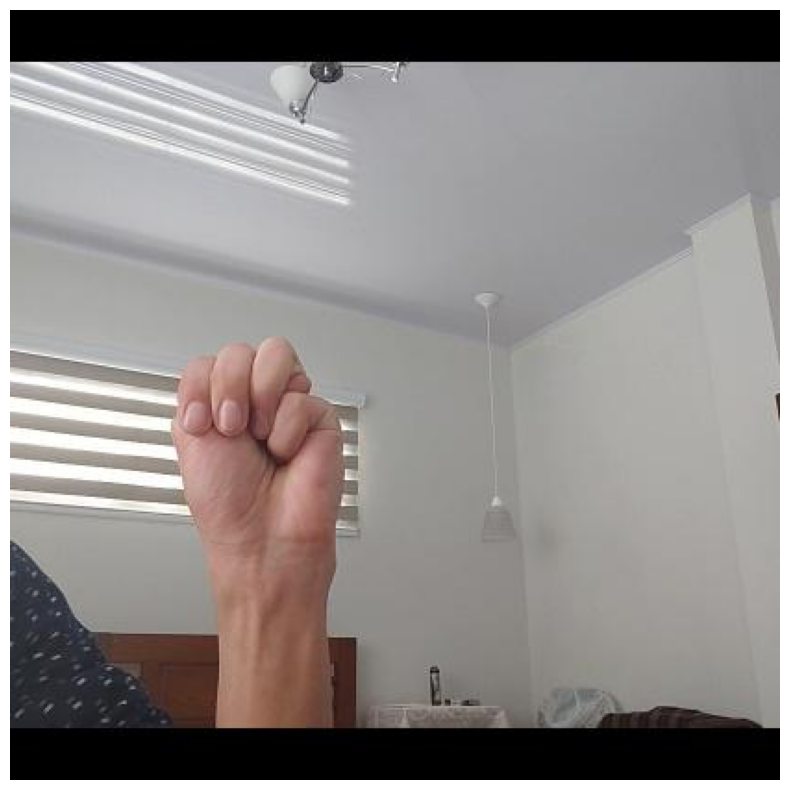


image 1/1 /content/Computer-Vision/test/images/Letra-D_4_jpg.rf.156f8e87cd99244955cf5088f8730218.jpg: 640x640 1 D, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


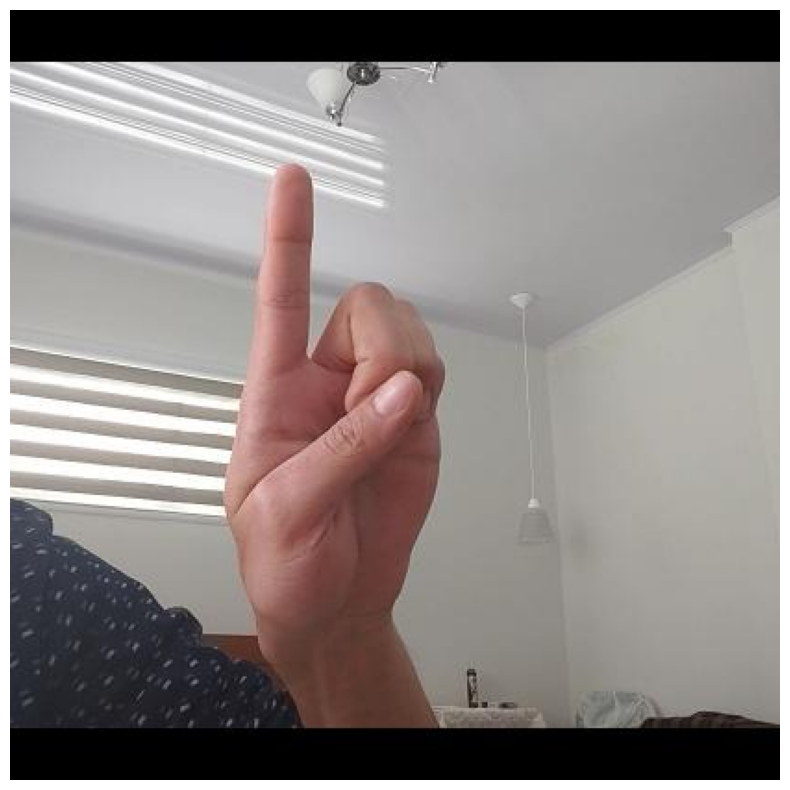


image 1/1 /content/Computer-Vision/test/images/Letra-W_6_jpg.rf.a642b66023e2110dc8acb3fdb496473e.jpg: 640x640 1 W, 15.0ms
Speed: 3.5ms preprocess, 15.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


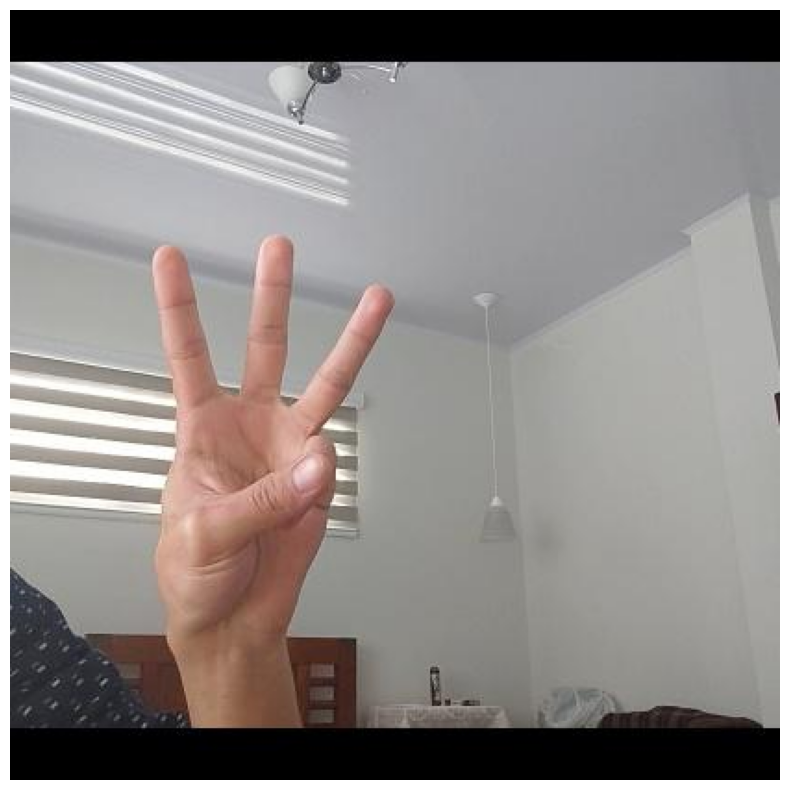


image 1/1 /content/Computer-Vision/test/images/Letra-A_17_jpg.rf.fb9621bb3e6fa269d2708595d3a9dab8.jpg: 640x640 1 A, 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


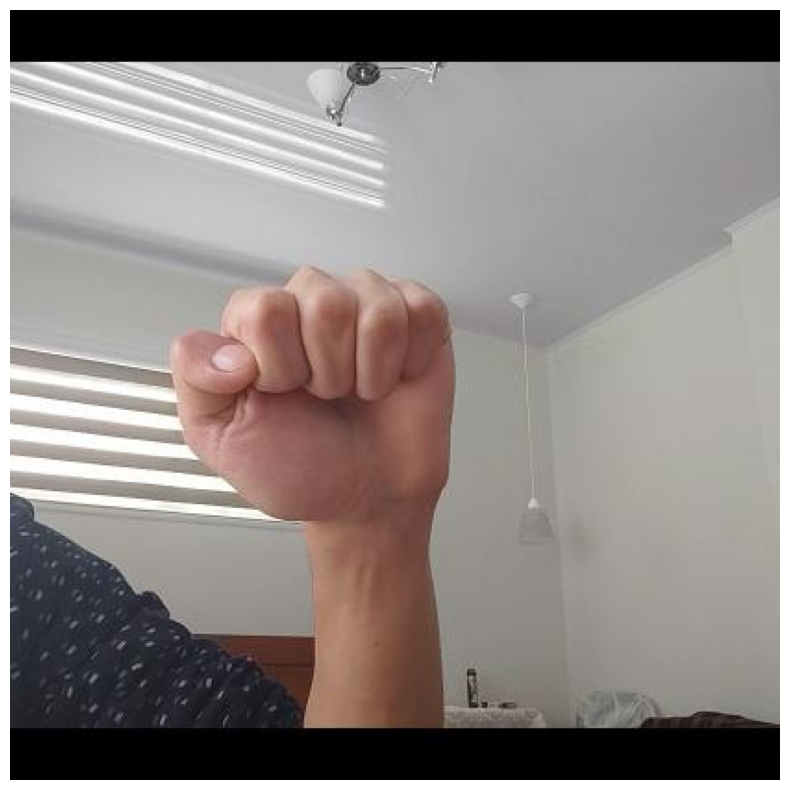


image 1/1 /content/Computer-Vision/test/images/Letra-Q_1_jpg.rf.e59aaea112ed2832144e2fd5041bf5b0.jpg: 640x640 1 Q, 15.0ms
Speed: 3.7ms preprocess, 15.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


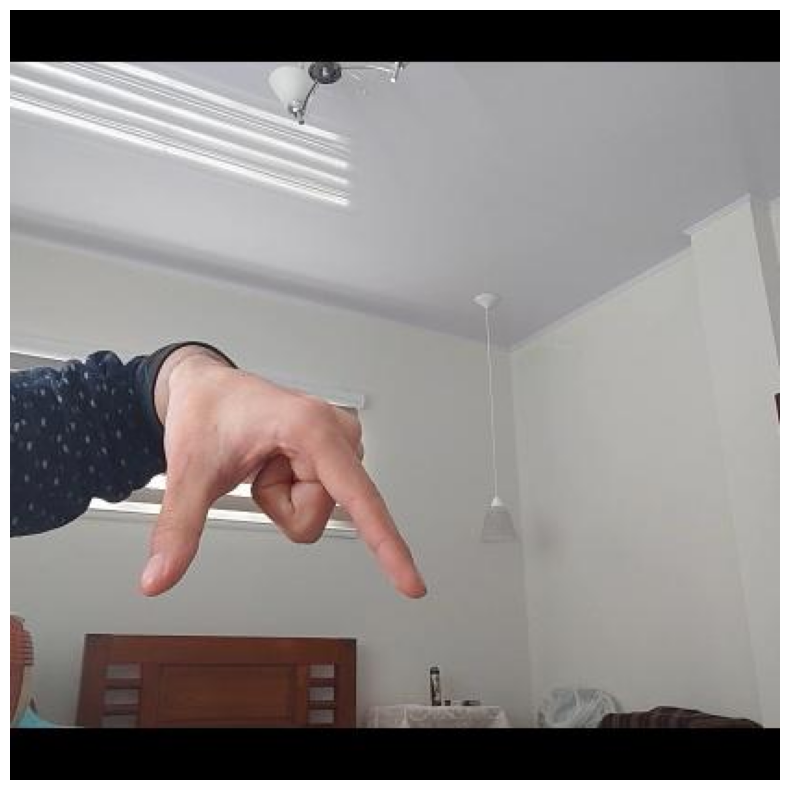


image 1/1 /content/Computer-Vision/test/images/Letra-Q_10_jpg.rf.41b225cbf237ddadf8529b190e599316.jpg: 640x640 1 Q, 14.9ms
Speed: 4.5ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


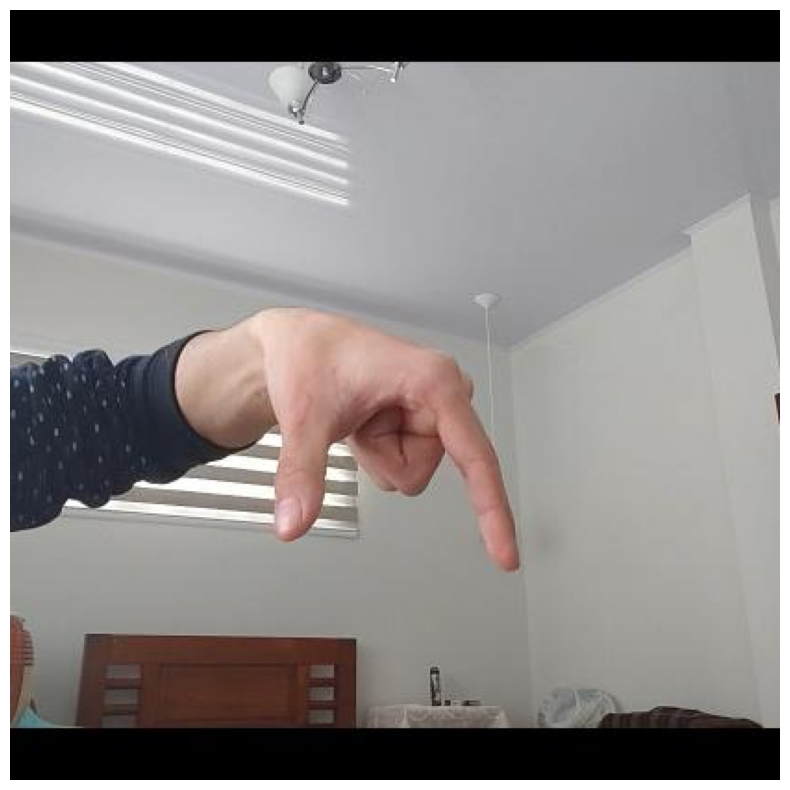


image 1/1 /content/Computer-Vision/test/images/Letra-Q_12_jpg.rf.1605b54c38870a26af7e36ffb3266d16.jpg: 640x640 1 Q, 14.9ms
Speed: 4.1ms preprocess, 14.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


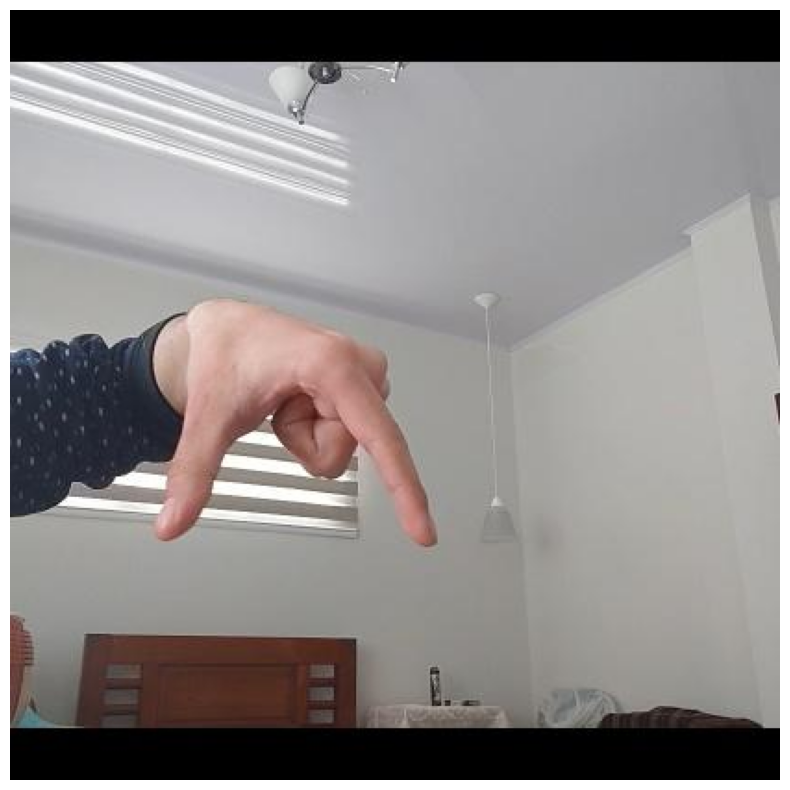


image 1/1 /content/Computer-Vision/test/images/Letra-C_11_jpg.rf.28a14d1ae4341873b1d4d21a7646f9b3.jpg: 640x640 1 C, 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


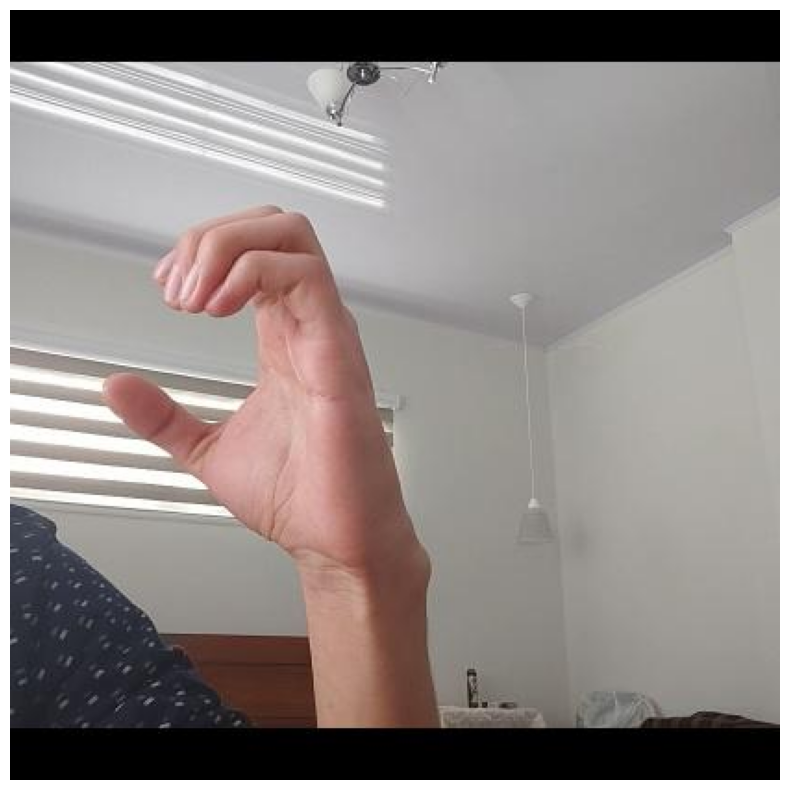


image 1/1 /content/Computer-Vision/test/images/Letra-K_3_jpg.rf.f10532437cdbe6650c1327719b76ccb7.jpg: 640x640 1 K, 15.0ms
Speed: 4.1ms preprocess, 15.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


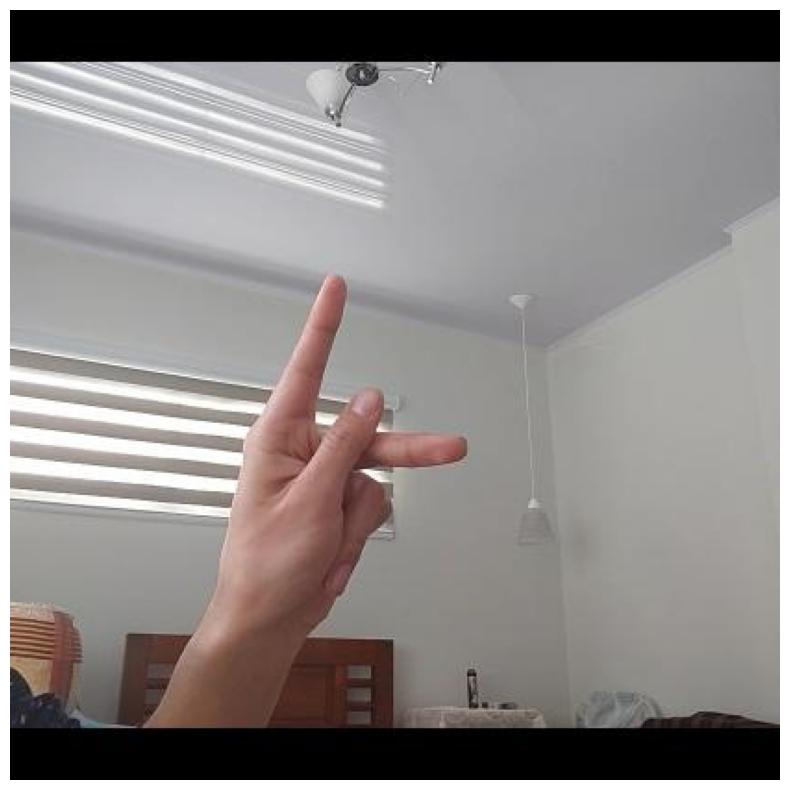


image 1/1 /content/Computer-Vision/test/images/Letra-Y_1_jpg.rf.826fe8aaebc87717cf61d33e0f0d930a.jpg: 640x640 1 Y, 14.9ms
Speed: 6.1ms preprocess, 14.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


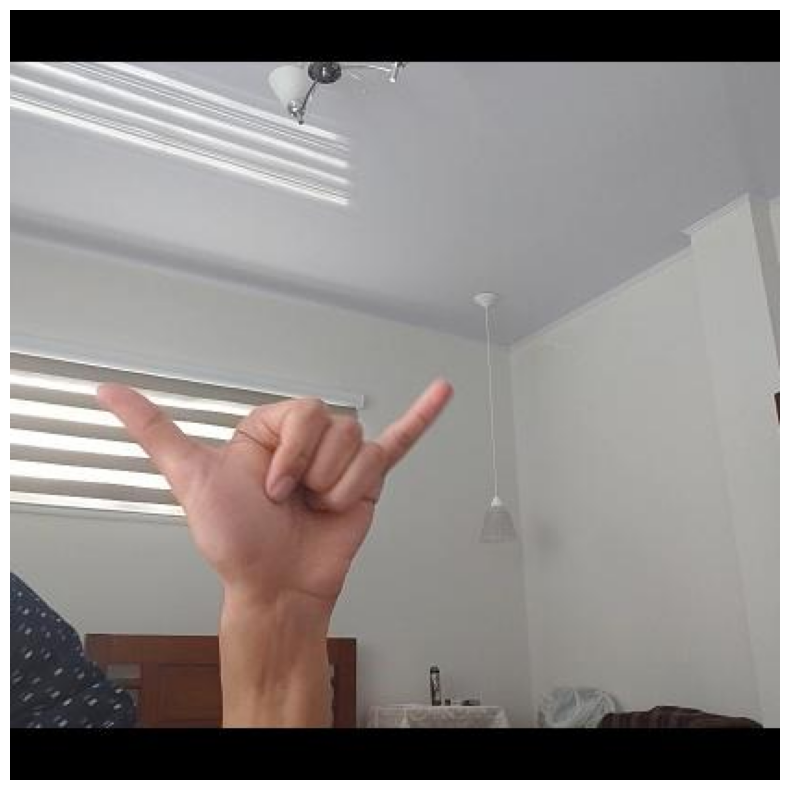


image 1/1 /content/Computer-Vision/test/images/Letra-U_14_jpg.rf.511c59f927fc2058cf10f7583b3d868d.jpg: 640x640 1 U, 14.9ms
Speed: 3.9ms preprocess, 14.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


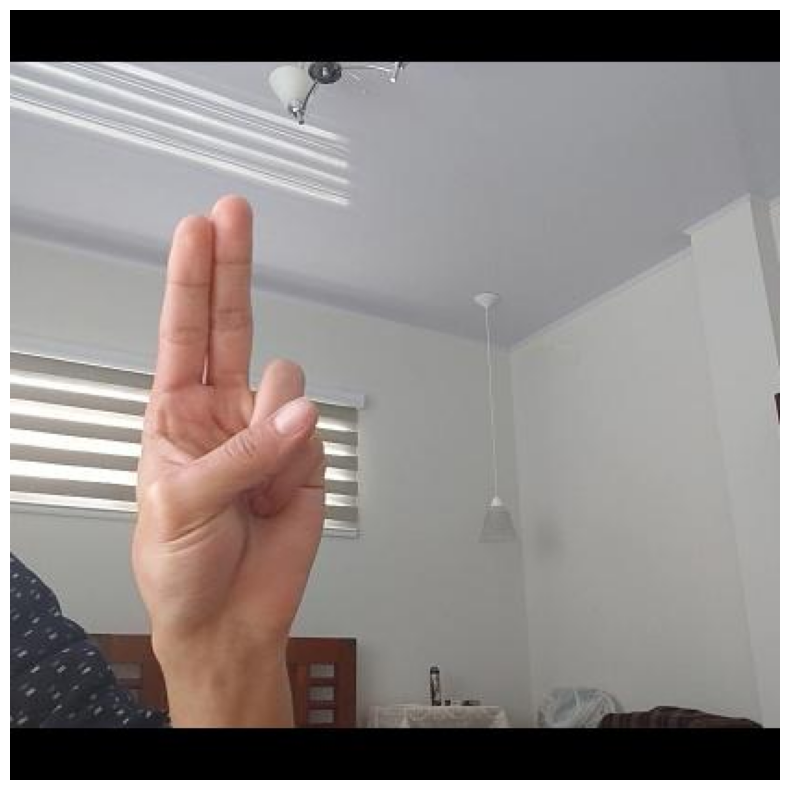


image 1/1 /content/Computer-Vision/test/images/Letra-N_0_jpg.rf.f873112d293d336ee38553042ff89466.jpg: 640x640 1 N, 14.9ms
Speed: 4.1ms preprocess, 14.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


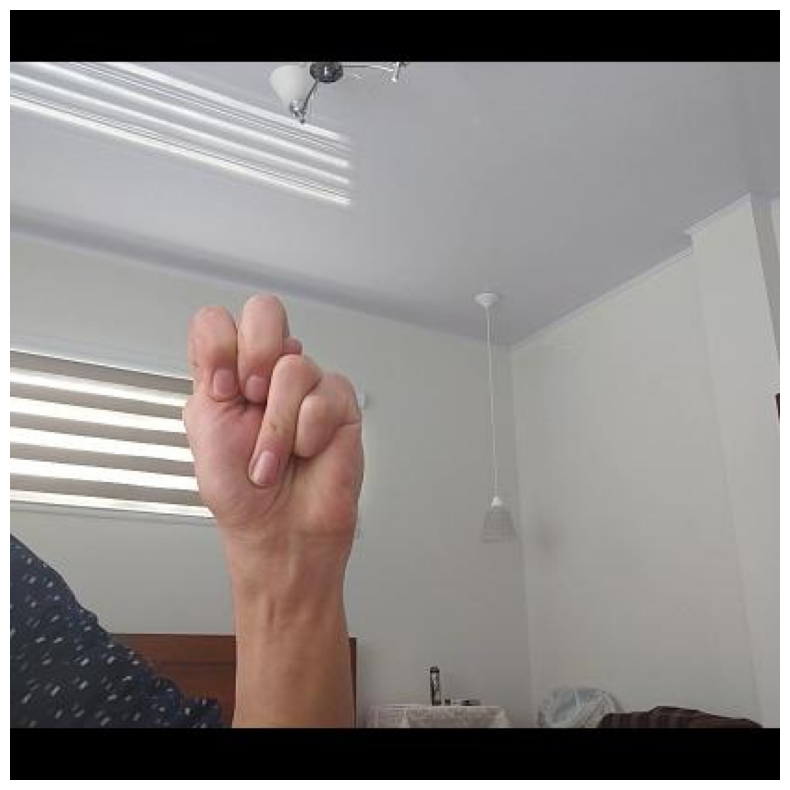


image 1/1 /content/Computer-Vision/test/images/Letra-M_4_jpg.rf.4495a8b42c8d623d5b8e8c68f42e3f00.jpg: 640x640 1 M, 14.9ms
Speed: 3.9ms preprocess, 14.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


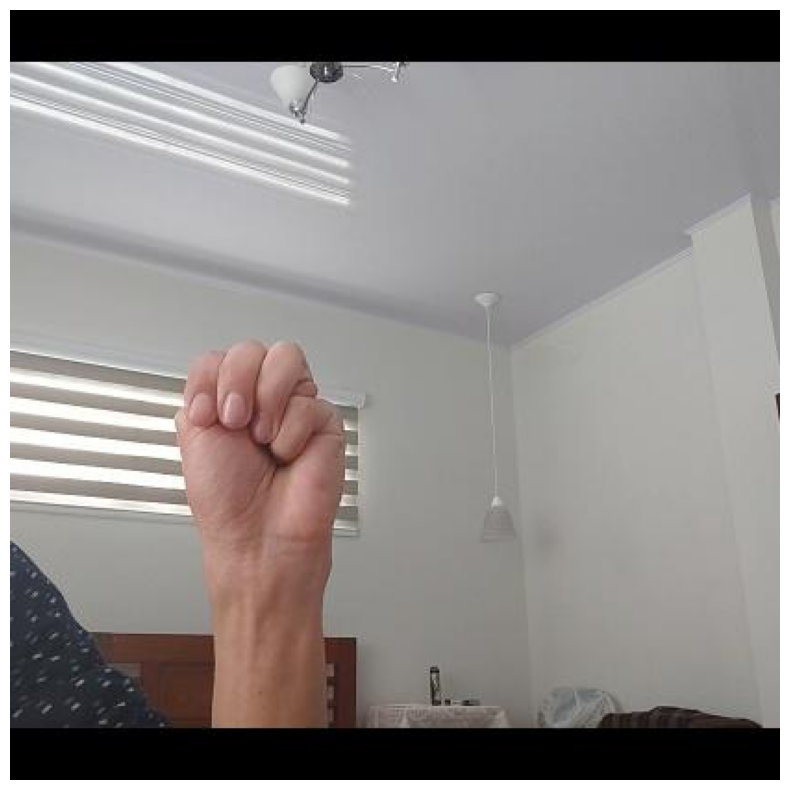


image 1/1 /content/Computer-Vision/test/images/Letra-Q_17_jpg.rf.ff5d31aa610fd5513abe0f99a4ed5f1f.jpg: 640x640 1 Q, 15.0ms
Speed: 4.2ms preprocess, 15.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


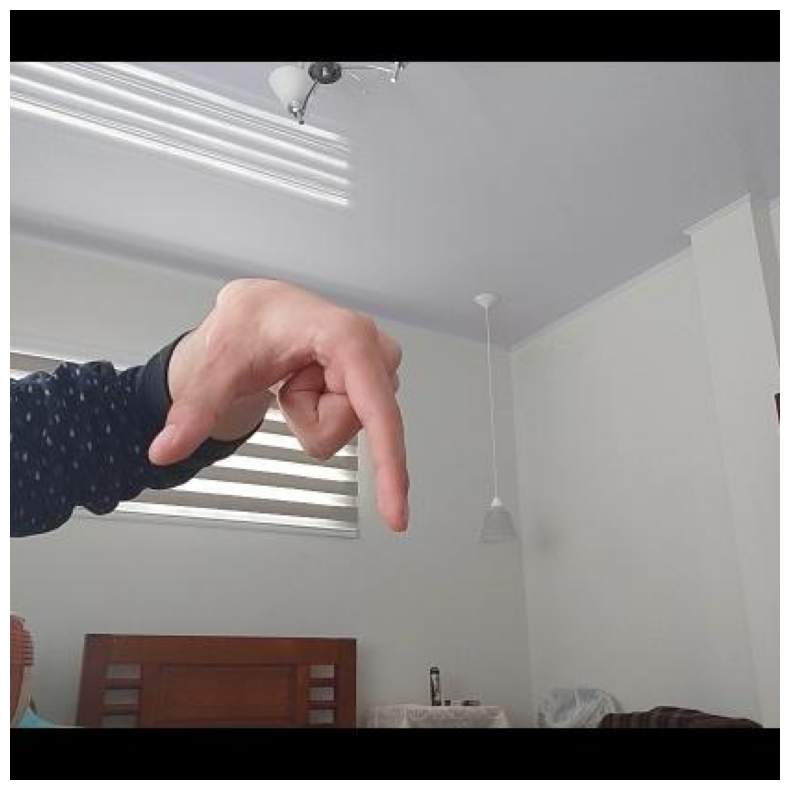


image 1/1 /content/Computer-Vision/test/images/Letra-G_12_jpg.rf.f8016526c6ef290bceed9258e2d8f2b6.jpg: 640x640 1 G, 16.2ms
Speed: 3.4ms preprocess, 16.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


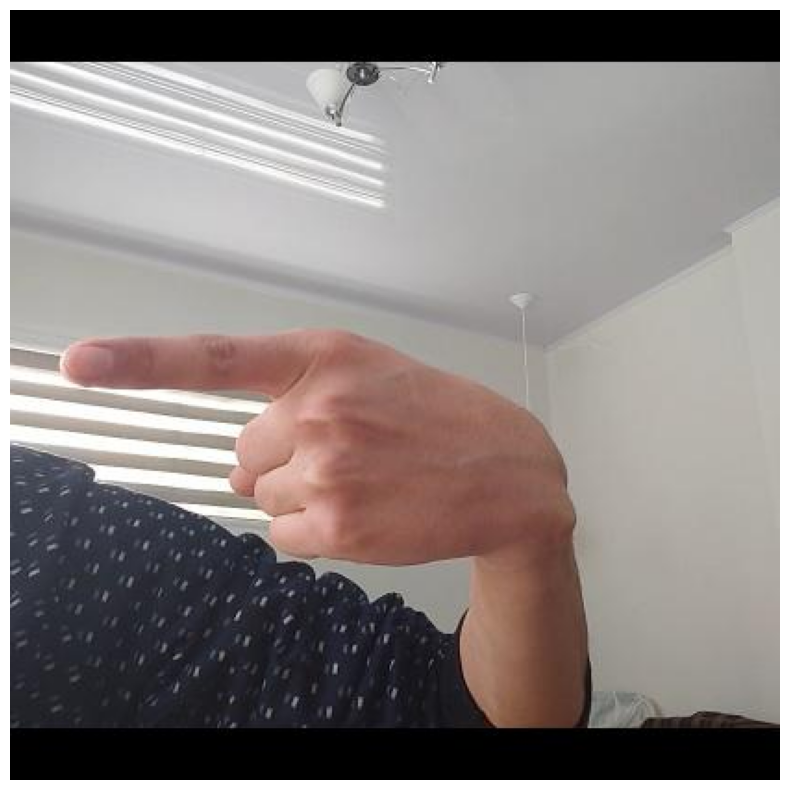


image 1/1 /content/Computer-Vision/test/images/Letra-I_16_jpg.rf.35b40a608980163a10f6c4bb6e7a91d5.jpg: 640x640 1 I, 14.9ms
Speed: 4.7ms preprocess, 14.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


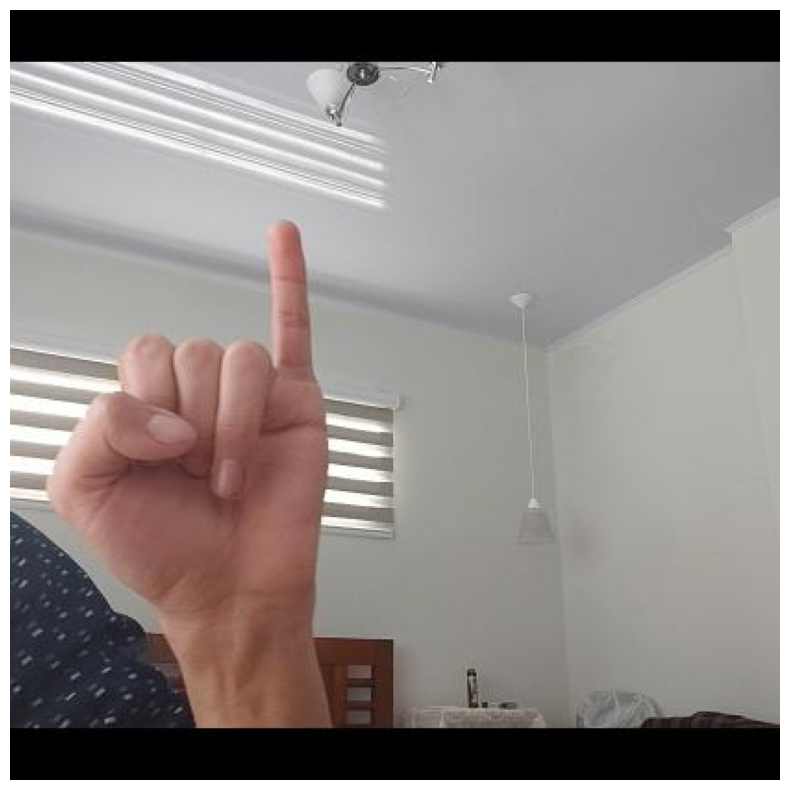


image 1/1 /content/Computer-Vision/test/images/Letra-X_2_jpg.rf.ee711190da94c47b2324cd8cadb252ab.jpg: 640x640 1 X, 15.2ms
Speed: 4.6ms preprocess, 15.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


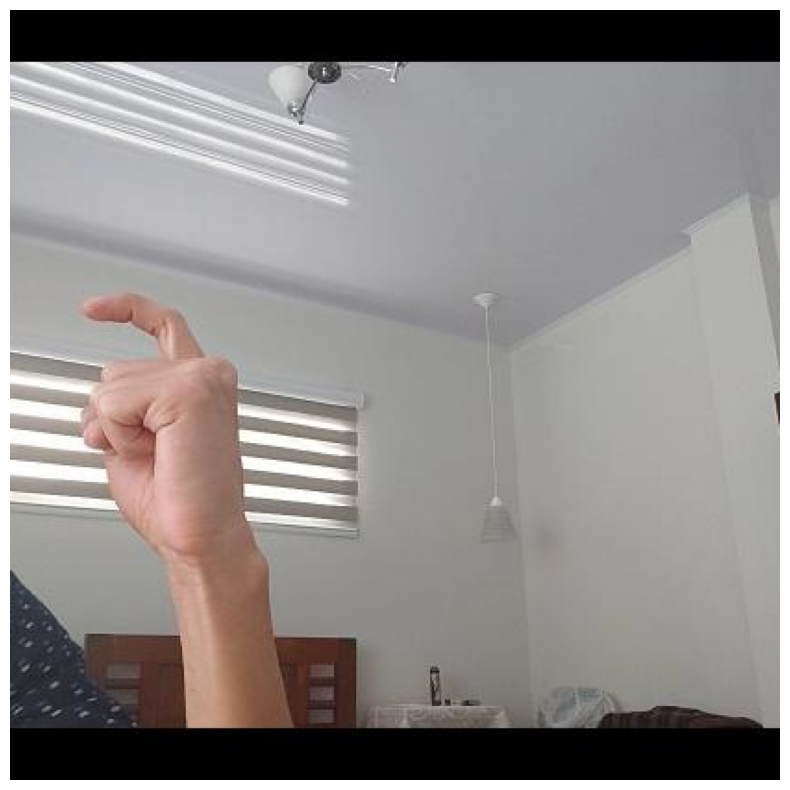


image 1/1 /content/Computer-Vision/test/images/Letra-K_11_jpg.rf.680a92956a5569f4b91f4a24feaf14fd.jpg: 640x640 1 K, 19.0ms
Speed: 3.5ms preprocess, 19.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


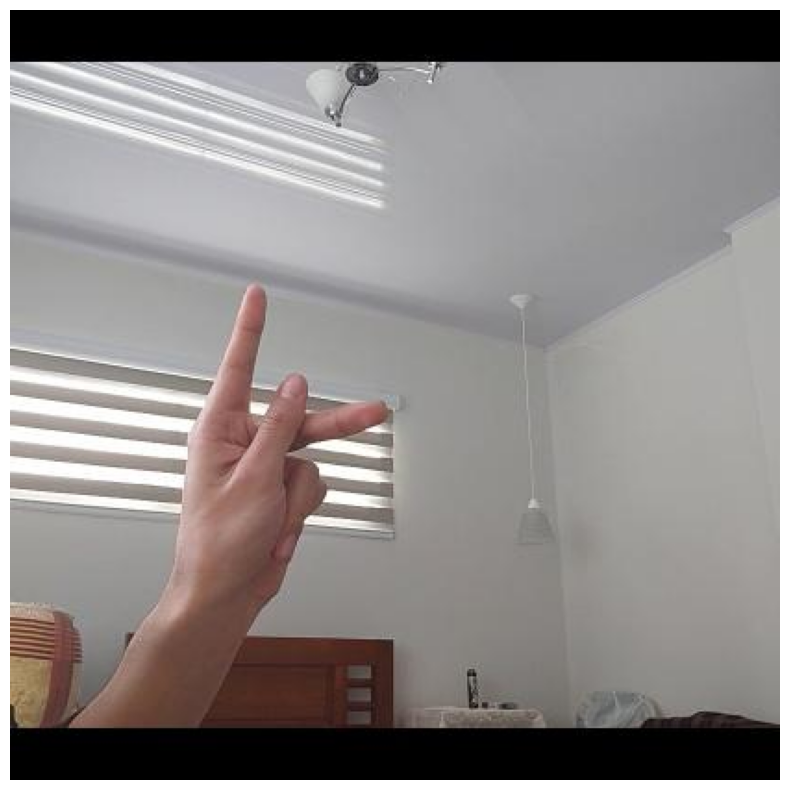


image 1/1 /content/Computer-Vision/test/images/Letra-Q_4_jpg.rf.b848a9f4963881481134047159602178.jpg: 640x640 1 Q, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


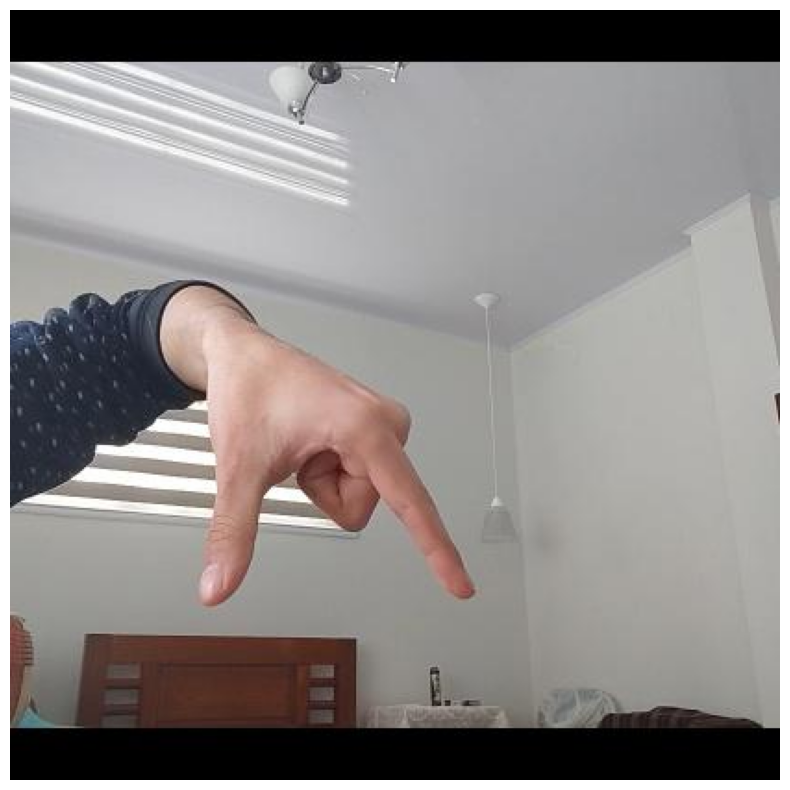


image 1/1 /content/Computer-Vision/test/images/Letra-X_13_jpg.rf.9817db612931e30eddb0a40ead8ab918.jpg: 640x640 1 X, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


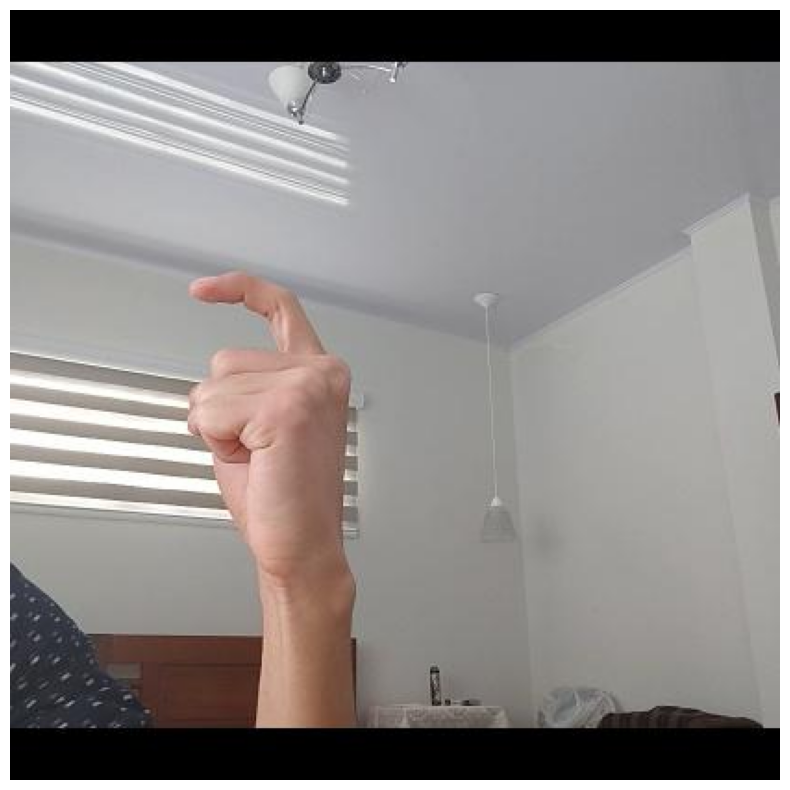


image 1/1 /content/Computer-Vision/test/images/Letra-C_4_jpg.rf.114970cc4386308f955be30eaf40b161.jpg: 640x640 1 C, 17.4ms
Speed: 5.9ms preprocess, 17.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


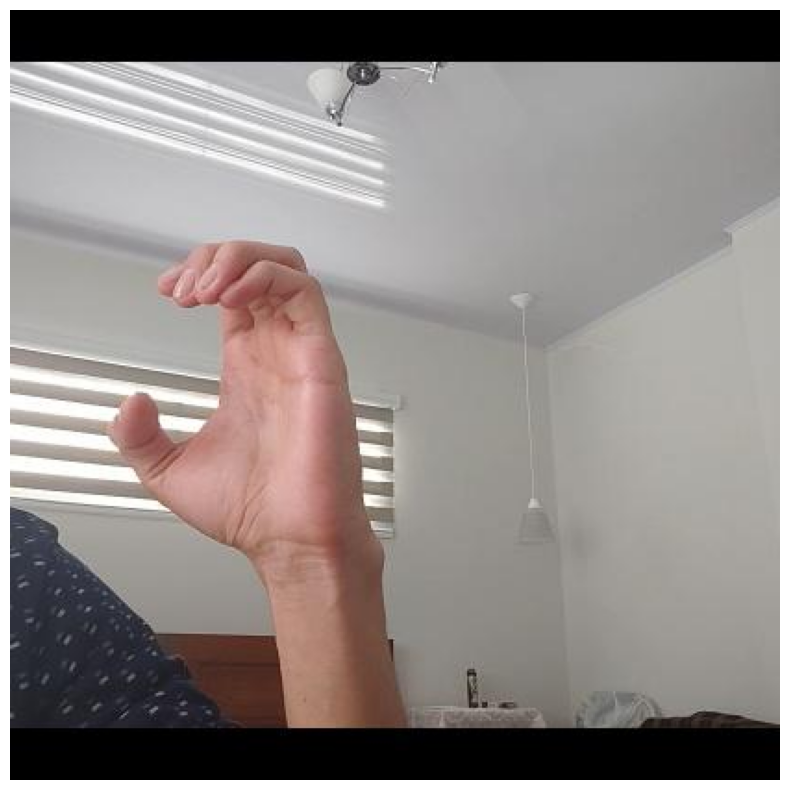


image 1/1 /content/Computer-Vision/test/images/Letra-U_16_jpg.rf.3e58858cc28995b0271f9c92e1518232.jpg: 640x640 1 U, 15.0ms
Speed: 3.7ms preprocess, 15.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


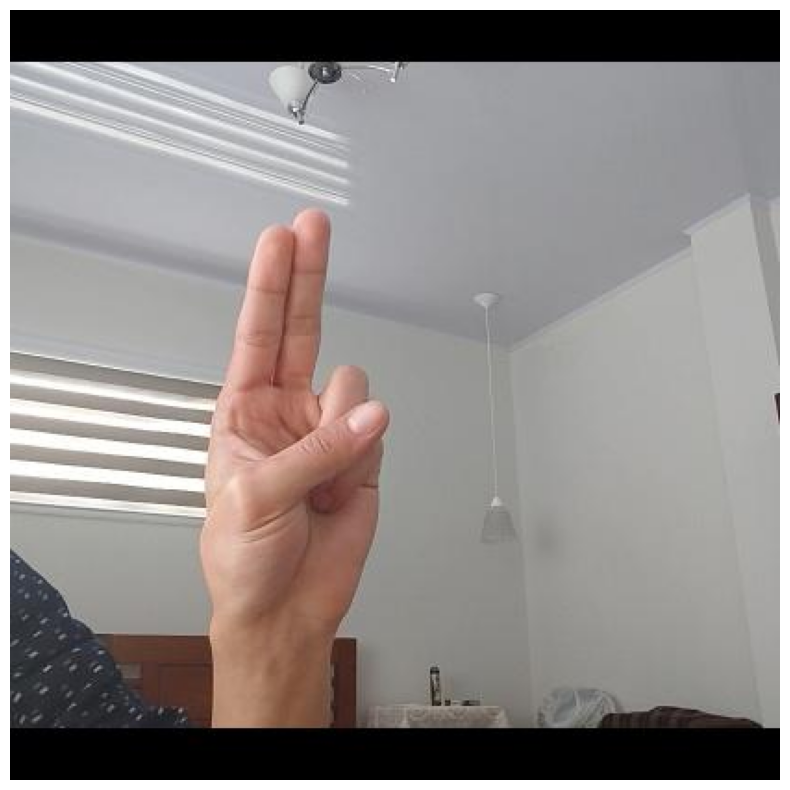


image 1/1 /content/Computer-Vision/test/images/Letra-T_13_jpg.rf.5b1808a8e41b7d51c661c0030a671f6a.jpg: 640x640 1 T, 17.2ms
Speed: 3.5ms preprocess, 17.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


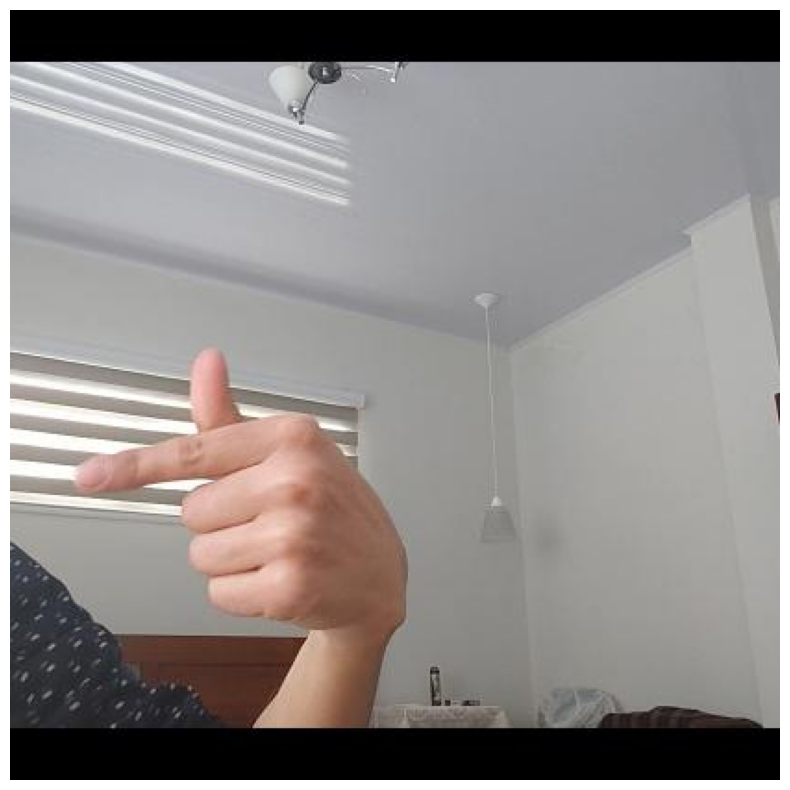


image 1/1 /content/Computer-Vision/test/images/Letra-F_14_jpg.rf.be8584c52708537f3477a465ed885c44.jpg: 640x640 1 F, 17.7ms
Speed: 6.4ms preprocess, 17.7ms inference, 5.7ms postprocess per image at shape (1, 3, 640, 640)


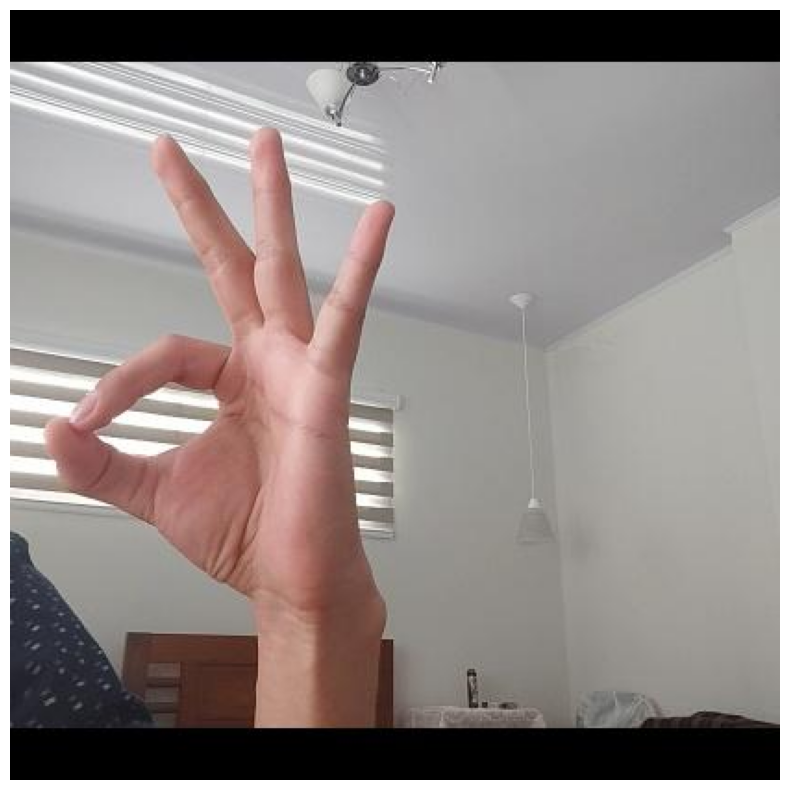


image 1/1 /content/Computer-Vision/test/images/Letra-B_18_jpg.rf.052ea3adead75fdd2dcf3432a2869c88.jpg: 640x640 1 B, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


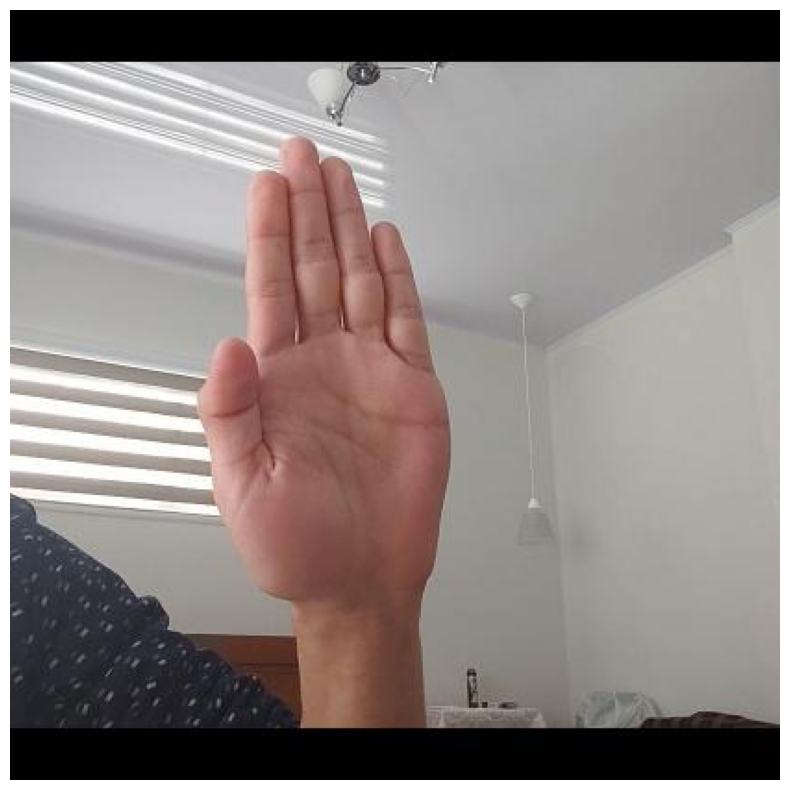


image 1/1 /content/Computer-Vision/test/images/Letra-M_16_jpg.rf.627f45f8b6403bb23827caa7737967c8.jpg: 640x640 1 M, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


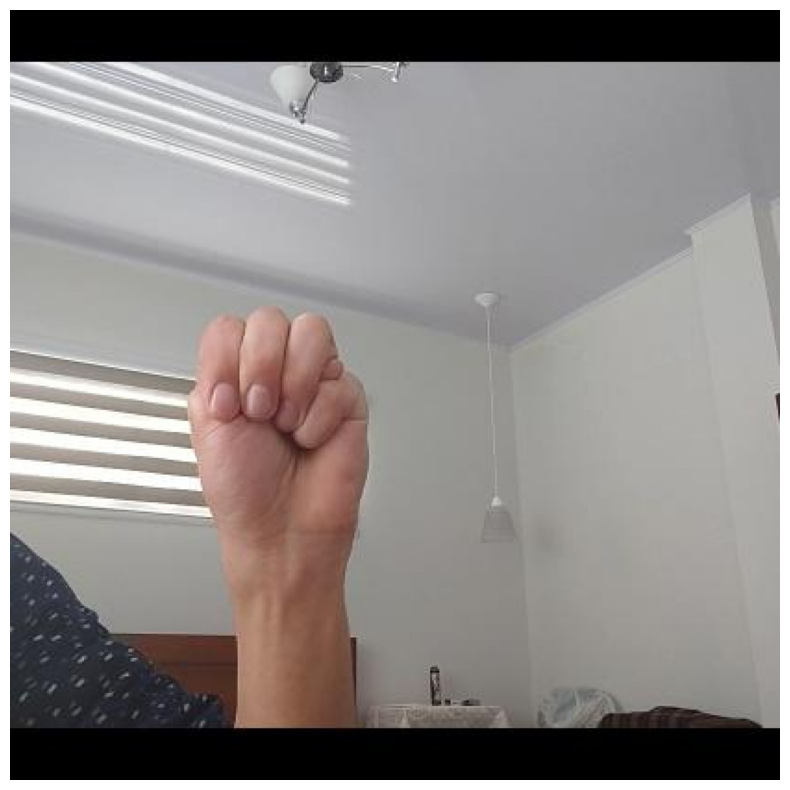


image 1/1 /content/Computer-Vision/test/images/Letra-D_15_jpg.rf.4ad3850e77c7b3c9cbb0aaced083d09e.jpg: 640x640 1 D, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 5.1ms postprocess per image at shape (1, 3, 640, 640)


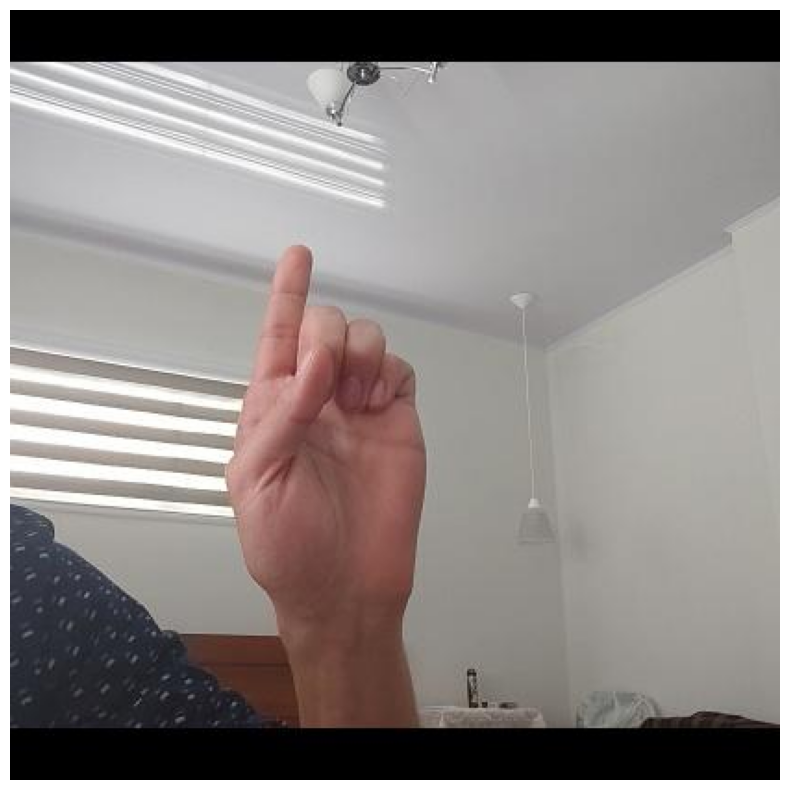


image 1/1 /content/Computer-Vision/test/images/Letra-Y_6_jpg.rf.a5c481599f379e5ae36dec945abe5c1d.jpg: 640x640 1 Y, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


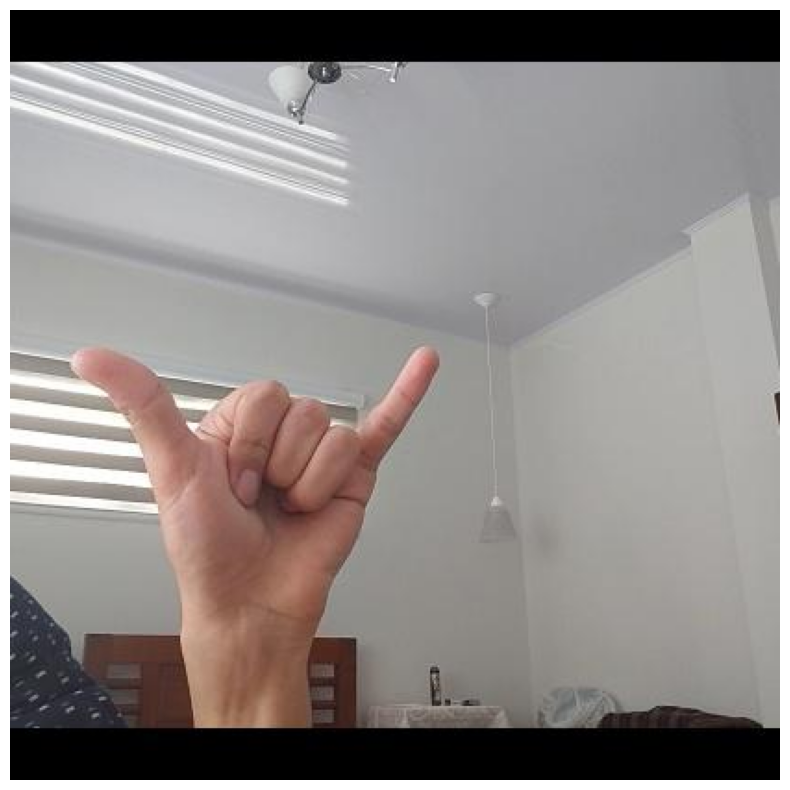


image 1/1 /content/Computer-Vision/test/images/Letra-E_2_jpg.rf.b1b38bac082dbc282a929154a105c480.jpg: 640x640 1 E, 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


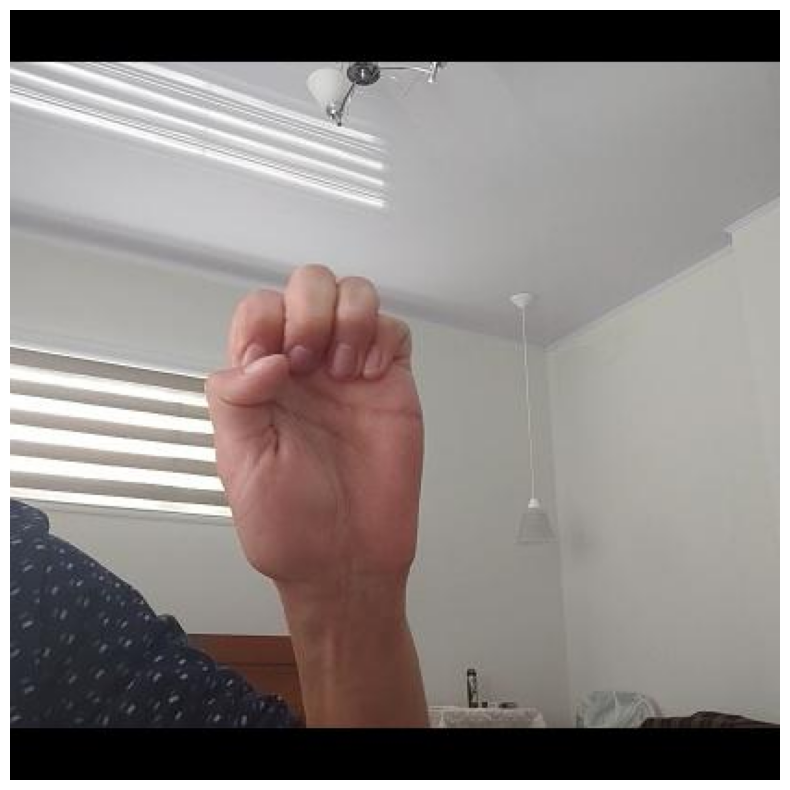


image 1/1 /content/Computer-Vision/test/images/Letra-U_6_jpg.rf.3c1b5f8646a662c20e85a09043b21ca8.jpg: 640x640 1 U, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


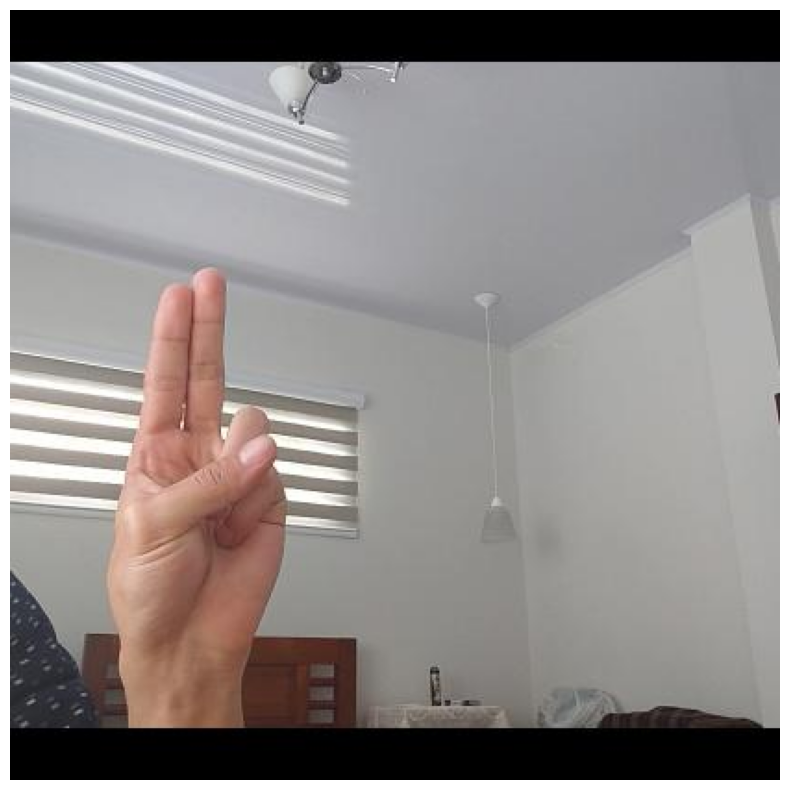


image 1/1 /content/Computer-Vision/test/images/Letra-L_19_jpg.rf.096fedb478a64ca2be558e73f33c789f.jpg: 640x640 1 L, 16.7ms
Speed: 3.4ms preprocess, 16.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


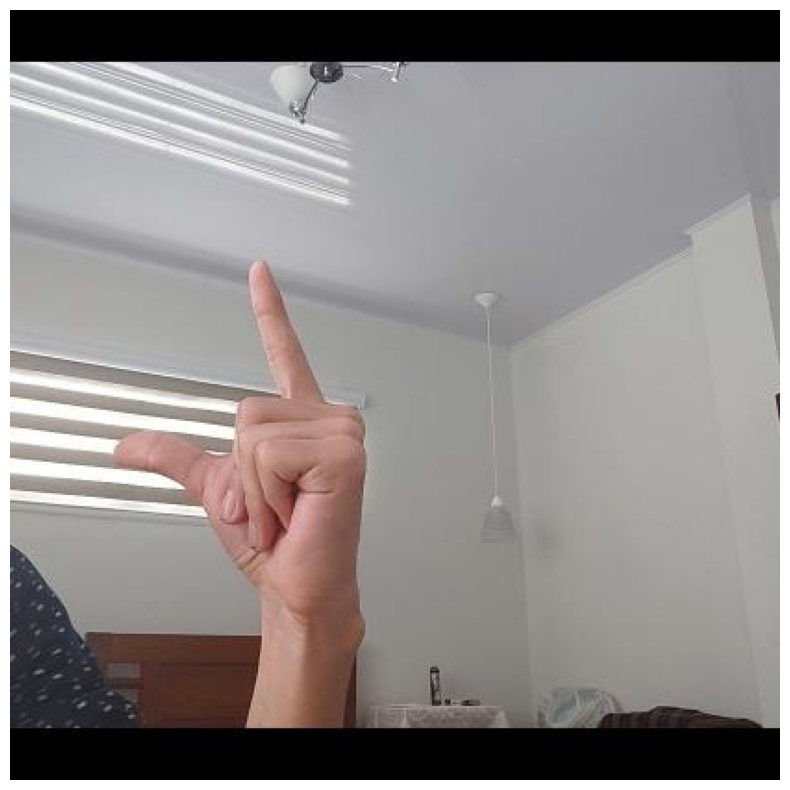


image 1/1 /content/Computer-Vision/test/images/Letra-B_11_jpg.rf.a6db0e84ed6ed155abebf03fe955465d.jpg: 640x640 1 B, 14.9ms
Speed: 3.5ms preprocess, 14.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


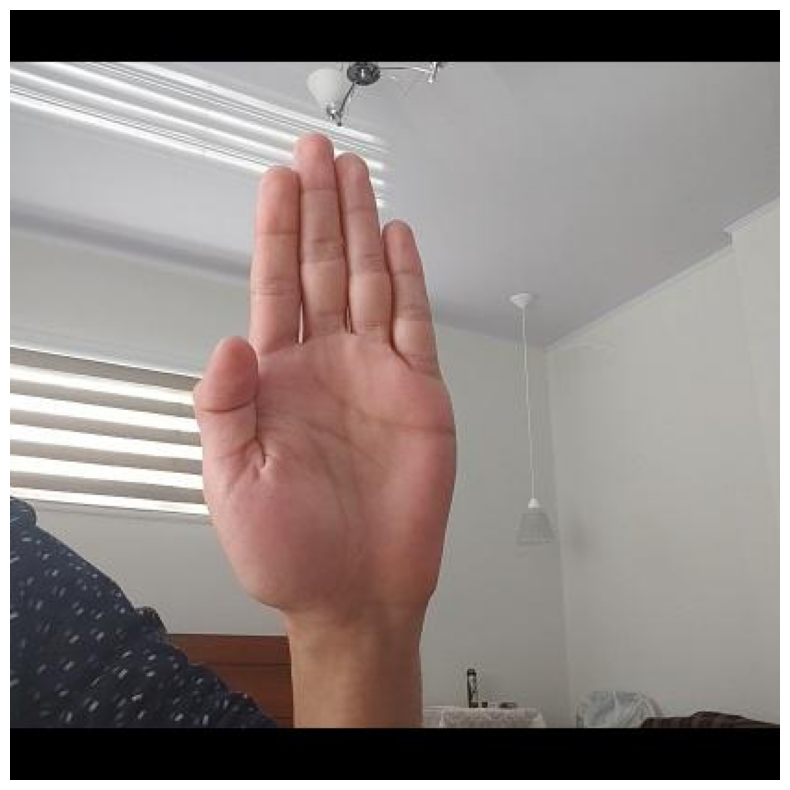


image 1/1 /content/Computer-Vision/test/images/Letra-G_14_jpg.rf.a280f00233a85f9836dd49f6c6e1c2bb.jpg: 640x640 1 G, 18.7ms
Speed: 3.5ms preprocess, 18.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


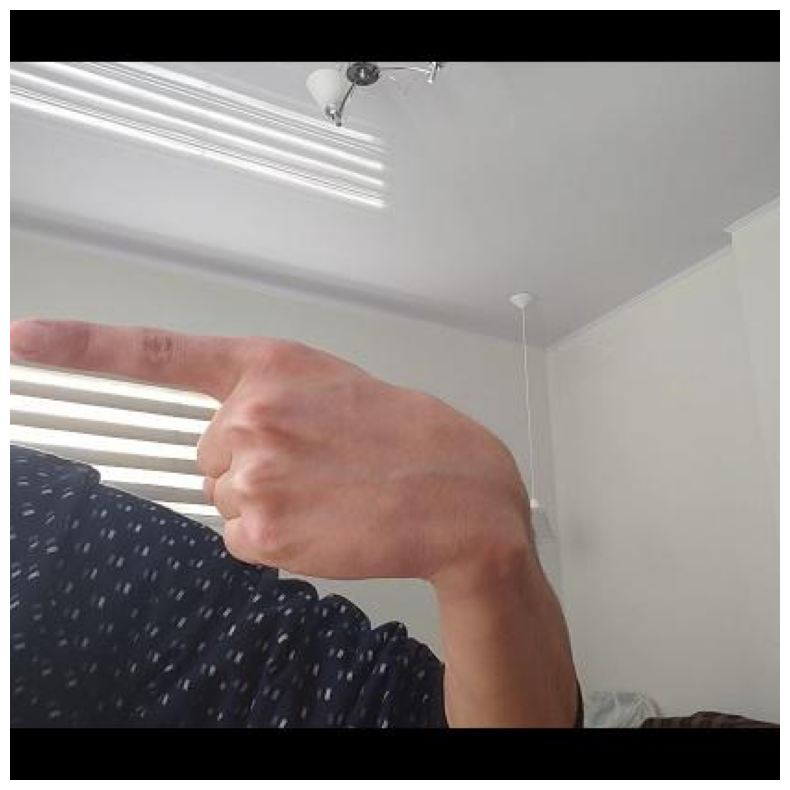


image 1/1 /content/Computer-Vision/test/images/Letra-F_8_jpg.rf.251027468b4fb10e3a2b9fdf2d137921.jpg: 640x640 1 F, 16.8ms
Speed: 3.5ms preprocess, 16.8ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 640)


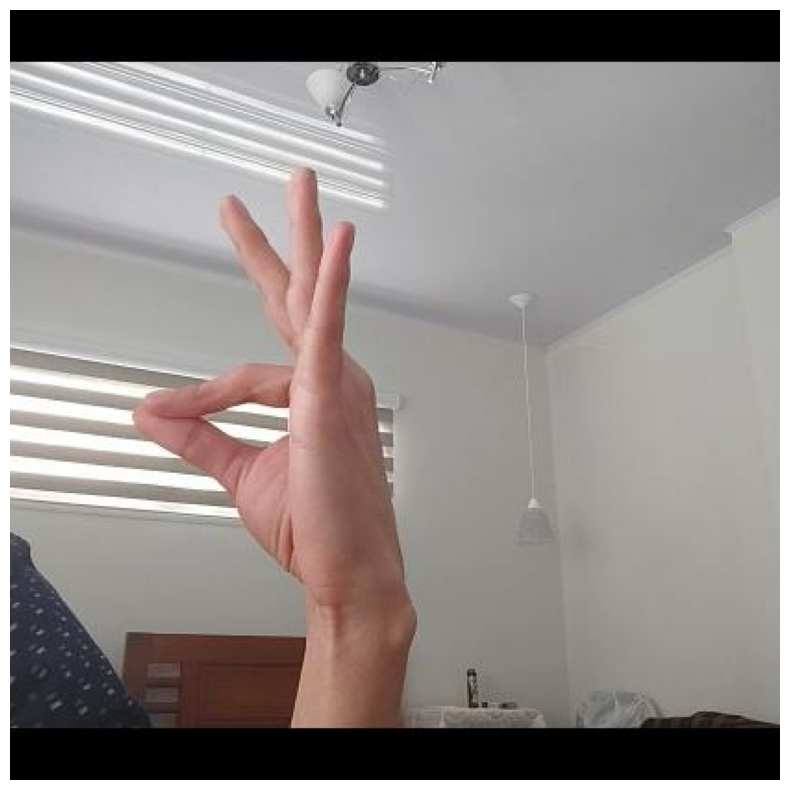


image 1/1 /content/Computer-Vision/test/images/Letra-Q_16_jpg.rf.37dc7d1e15d46e12fd19fecbd2b95516.jpg: 640x640 1 Q, 14.9ms
Speed: 3.4ms preprocess, 14.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


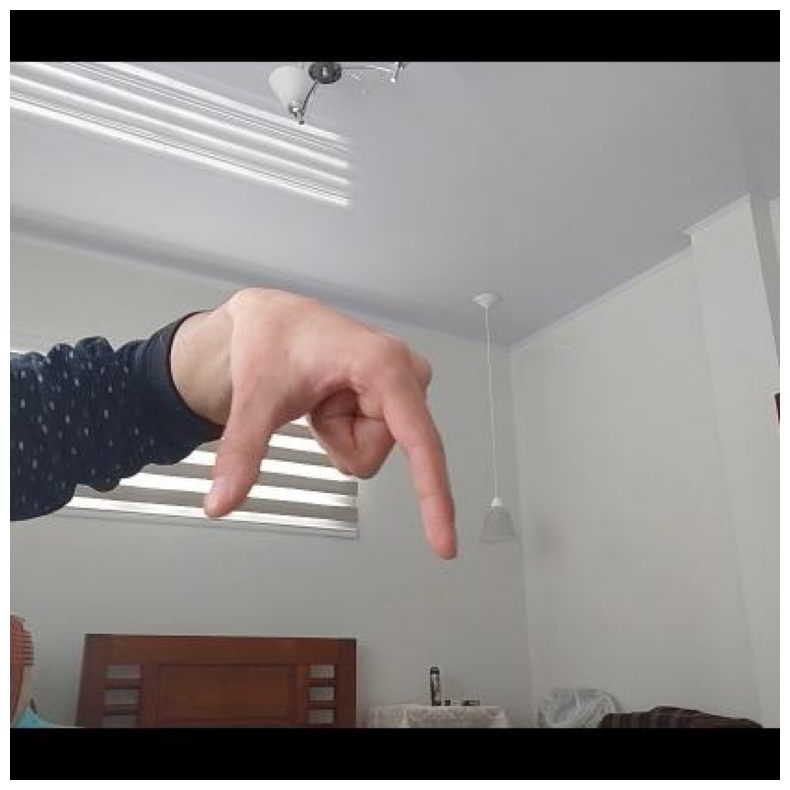


image 1/1 /content/Computer-Vision/test/images/Letra-S_12_jpg.rf.c3165b22c57aea12cc769847c3d7b6af.jpg: 640x640 1 S, 18.4ms
Speed: 3.4ms preprocess, 18.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


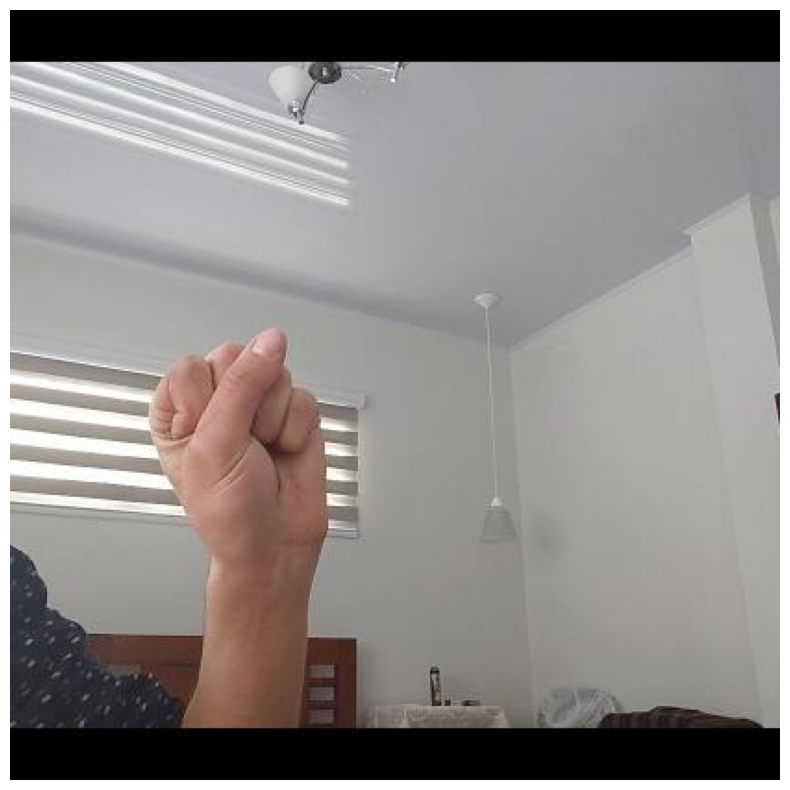


image 1/1 /content/Computer-Vision/test/images/Letra-R_16_jpg.rf.2fa3a2d88507fcc1f76e9a680e0680a6.jpg: 640x640 1 R, 14.9ms
Speed: 3.3ms preprocess, 14.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


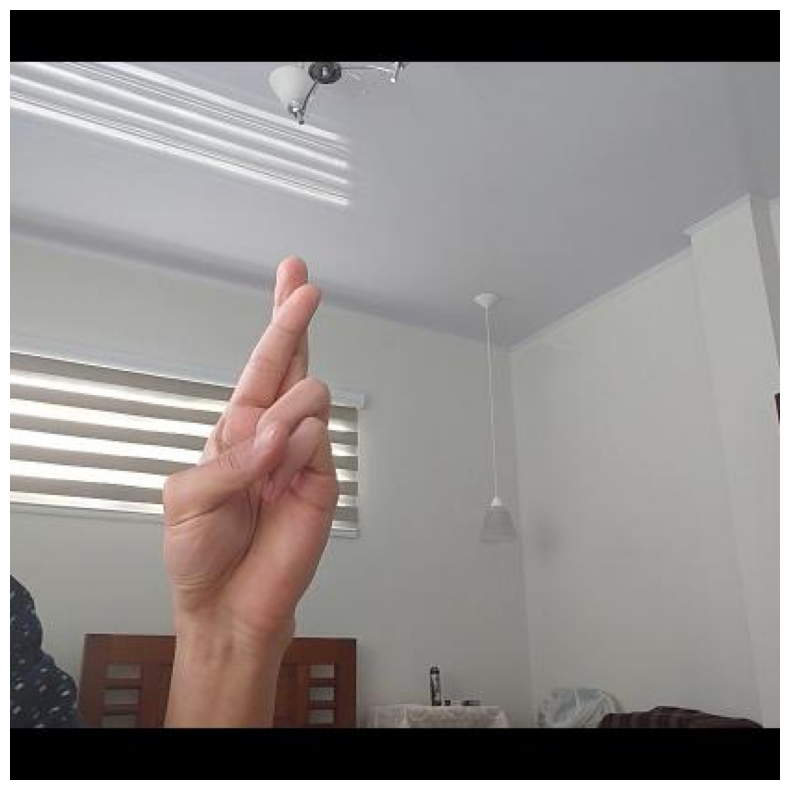


image 1/1 /content/Computer-Vision/test/images/Letra-E_0_jpg.rf.246dfd746f387125a777f5b130b0c685.jpg: 640x640 1 E, 14.9ms
Speed: 3.4ms preprocess, 14.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


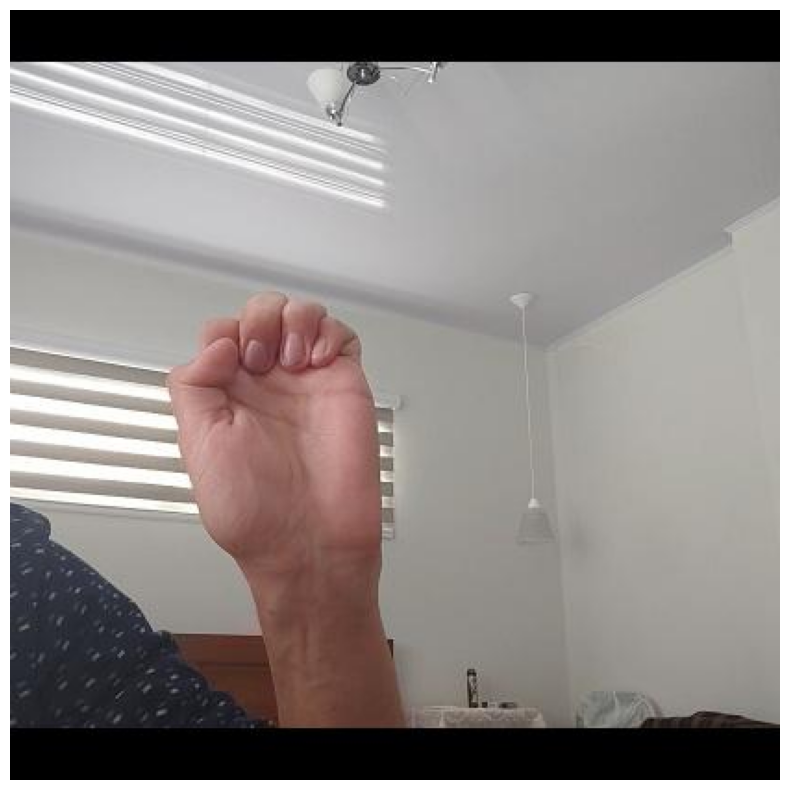


image 1/1 /content/Computer-Vision/test/images/Letra-S_6_jpg.rf.8634bf3ea457d4252b4886d3252702e1.jpg: 640x640 1 S, 14.9ms
Speed: 3.6ms preprocess, 14.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


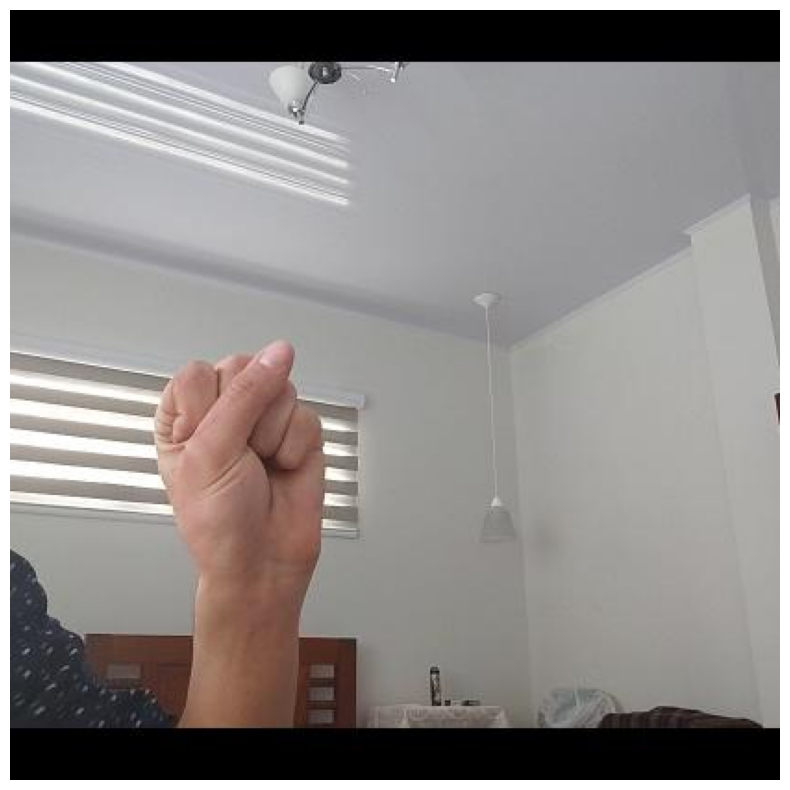


image 1/1 /content/Computer-Vision/test/images/Letra-W_18_jpg.rf.6c4de0dd2c7dc0592957bfdea5d10b9c.jpg: 640x640 1 W, 14.9ms
Speed: 3.4ms preprocess, 14.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


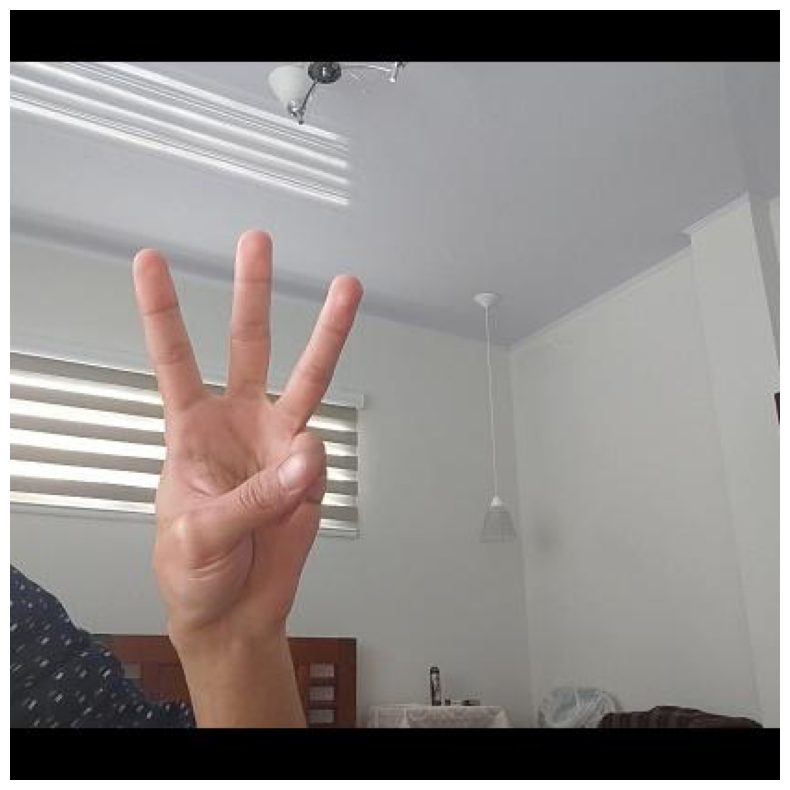

In [ ]:
from ultralytics import YOLO
import os
import matplotlib.pyplot as plt
import cv2

# Cargar el modelo entrenado (asegúrate de usar la ruta correcta a los pesos entrenados)
model = YOLO('/content/runs/detect/train/weights/best.pt')  # Ruta al modelo entrenado

# Ruta a la carpeta con las imágenes de test
test_images_dir = '/content/Computer-Vision/test/images'

# Realizar predicciones sobre las imágenes de test
for img_file in os.listdir(test_images_dir):
    if img_file.endswith(('.jpg', '.jpeg', '.png')):  # Verifica si es una imagen
        img_path = os.path.join(test_images_dir, img_file)

        # Realizar la predicción
        results = model.predict(img_path)

        # Acceder al primer objeto en la lista de resultados
        result = results[0]

        # Mostrar la imagen con la predicción
        img = cv2.imread(img_path)  # Lee la imagen usando OpenCV
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convierte de BGR a RGB para matplotlib

        # Configura la visualización con matplotlib
        plt.figure(figsize=(10, 10))
        plt.imshow(img_rgb)
        plt.axis('off')  # No mostrar los ejes
        plt.show()

        # Guardar la imagen procesada en la carpeta 'runs/detect/exp'
        result.save()  # Guarda las imágenes con las predicciones


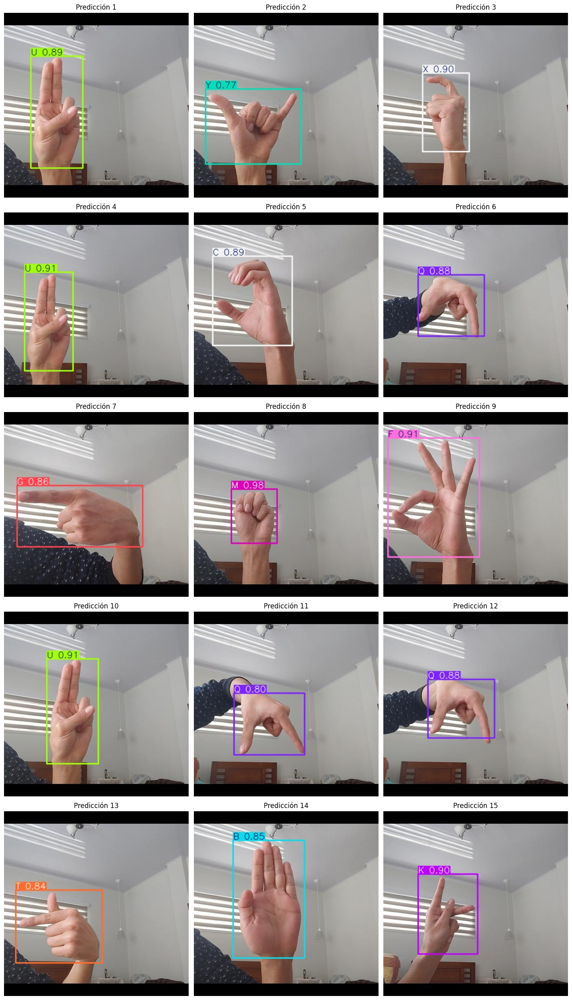

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Ruta a las imágenes (ajusta según donde las guardaste)
results_dir = '/content/results'  # Si están en el entorno local de Colab
# results_dir = '/content/drive/MyDrive/Computer-Vision/results/'  # Si están en Google Drive

# Listar las imágenes en el directorio
image_files = [f for f in os.listdir(results_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Ajustar el número de filas y columnas de subplots
num_cols = 3  # Número de columnas
num_rows = (len(image_files[:15]) + num_cols - 1) // num_cols  # Calcular el número de filas necesario

# Mostrar algunas de las imágenes
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))  # Crear la figura y los subplots
fig.subplots_adjust(hspace=0.5)  # Ajustar el espacio vertical entre subplots

for i, img_file in enumerate(image_files[:15]):  # Mostrar solo las primeras 15 imágenes
    img_path = os.path.join(results_dir, img_file)
    img = Image.open(img_path)

    # Calcular la posición del subplot actual
    row = i // num_cols
    col = i % num_cols

    # Mostrar la imagen en el subplot correspondiente
    axes[row, col].imshow(img)
    axes[row, col].axis('off')
    axes[row, col].set_title(f"Predicción {i + 1}")

plt.tight_layout()
plt.show()

## Test


image 1/1 /content/Computer-Vision/test/images/Letra-A_17_jpg.rf.fb9621bb3e6fa269d2708595d3a9dab8.jpg: 640x640 1 A, 14.8ms
Speed: 2.6ms preprocess, 14.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


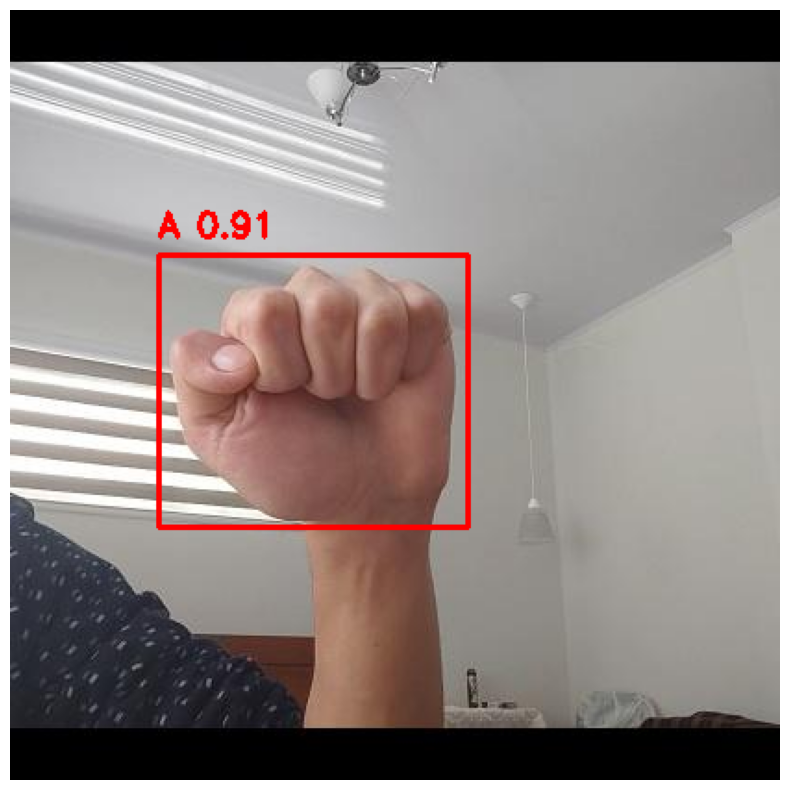

In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Cargar el modelo entrenado
model = YOLO('/content/runs/detect/train/weights/best.pt')  # Ruta al modelo entrenado

# Ruta a la imagen de prueba
img_path = '/content/Computer-Vision/test/images/Letra-A_17_jpg.rf.fb9621bb3e6fa269d2708595d3a9dab8.jpg'

# Realizar la predicción
results = model.predict(img_path)

# Acceder a las predicciones (cajas delimitadoras)
predictions = results[0].boxes

# Leer la imagen con OpenCV
img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convertir de BGR a RGB para matplotlib

# Dibujar las cajas delimitadoras sobre la imagen
for i in range(len(predictions.cls)):
    # Coordenadas de la caja delimitadora
    x1, y1, x2, y2 = predictions.xyxy[i].cpu().numpy()

    # Convertir a enteros
    x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)

    # Dibujar el rectángulo sobre la imagen
    cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (255, 0, 0), 2)  # Rojo, grosor 2

    # Obtener el nombre de la clase y la confianza
    class_id = int(predictions.cls[i].cpu().numpy())
    class_name = results[0].names[class_id]
    confidence = predictions.conf[i].cpu().numpy()

    # Escribir el texto sobre la caja
    label = f'{class_name} {confidence:.2f}'
    cv2.putText(img_rgb, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

# Mostrar la imagen con las cajas delimitadoras
plt.figure(figsize=(10, 10))
plt.imshow(img_rgb)
plt.axis('off')
plt.show()


Vamos a hacerlo con varias imagenes


image 1/1 /content/Computer-Vision/test/images/Letra-L_2_jpg.rf.b3765a8b035a3ce64db65bfd7c180d83.jpg: 640x640 1 L, 14.8ms
Speed: 2.2ms preprocess, 14.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Computer-Vision/test/images/Letra-X_17_jpg.rf.f1e59069ada4309ce6aecc4e08849519.jpg: 640x640 1 X, 14.8ms
Speed: 3.5ms preprocess, 14.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Computer-Vision/test/images/Letra-M_2_jpg.rf.513849bcfba0b6d2f453fff57e7e0c91.jpg: 640x640 1 M, 14.8ms
Speed: 2.4ms preprocess, 14.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Computer-Vision/test/images/Letra-D_4_jpg.rf.156f8e87cd99244955cf5088f8730218.jpg: 640x640 1 D, 14.8ms
Speed: 2.3ms preprocess, 14.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Computer-Vision/test/images/Letra-W_6_jpg.rf.a642b66023e2110dc8acb3fdb496473e.jpg: 640x640 1 W, 14.

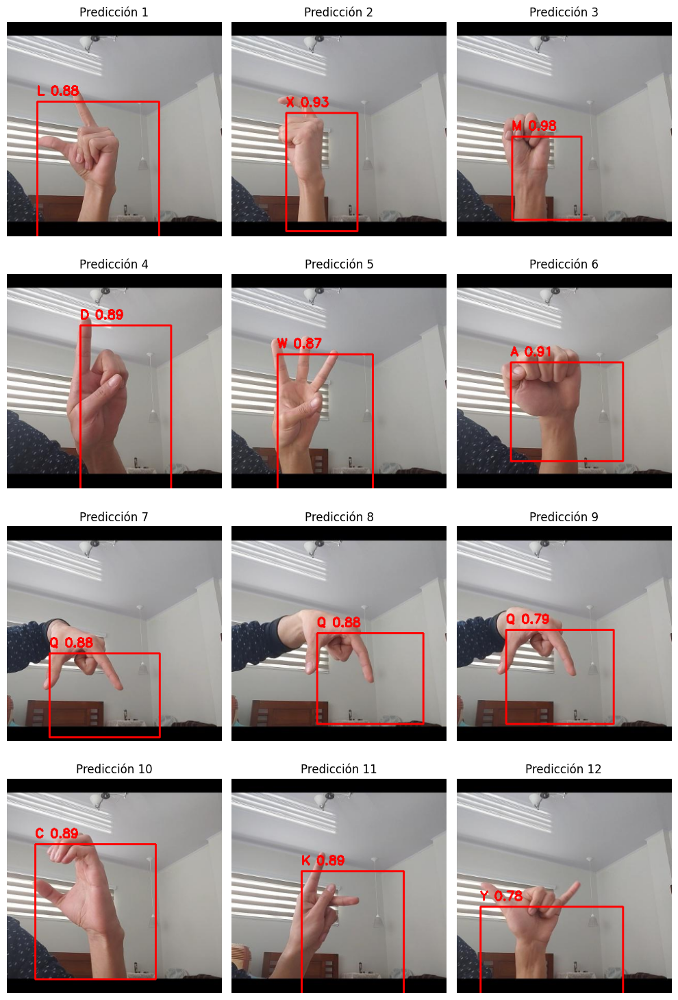

In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import os

# Cargar el modelo entrenado
model = YOLO('/content/runs/detect/train/weights/best.pt')  # Ruta al modelo entrenado

# Ruta a la carpeta con las imágenes de test
test_images_dir = '/content/Computer-Vision/test/images'

# Configurar el número de imágenes a mostrar
num_images_to_show = 12
fig, axes = plt.subplots(4, 3, figsize=(10, 15))  # Mostrar 10 imágenes en una grilla de 4 filas y 3 columnas

# Procesar las primeras 10 imágenes en la carpeta
for i, img_file in enumerate(os.listdir(test_images_dir)):
    if i >= num_images_to_show:
        break

    if img_file.endswith(('.jpg', '.jpeg', '.png')):
        img_path = os.path.join(test_images_dir, img_file)  # Asegúrate de que img_path sea la ruta completa de la imagen

        # Realizar la predicción
        results = model.predict(img_path)

        # Acceder a las predicciones (cajas delimitadoras)
        predictions = results[0].boxes

        # Leer la imagen con OpenCV
        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convertir de BGR a RGB para matplotlib

        # Redimensionar la imagen
        img_resized = cv2.resize(img_rgb, (320, 320))  # Redimensiona a 320x320 píxeles

        # Dibujar las cajas delimitadoras sobre la imagen
        for j in range(len(predictions.cls)):
            # Coordenadas de la caja delimitadora
            x1, y1, x2, y2 = predictions.xyxy[j].cpu().numpy()

            # Convertir a enteros
            x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)

            # Dibujar el rectángulo sobre la imagen
            cv2.rectangle(img_resized, (x1, y1), (x2, y2), (255, 0, 0), 2)  # Rojo, grosor 2

            # Obtener el nombre de la clase y la confianza
            class_id = int(predictions.cls[j].cpu().numpy())
            class_name = results[0].names[class_id]
            confidence = predictions.conf[j].cpu().numpy()

            # Escribir el texto sobre la caja
            label = f'{class_name} {confidence:.2f}'
            cv2.putText(img_resized, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

        # Mostrar la imagen con las cajas delimitadoras en la grilla
        ax = axes[i // 3, i % 3]
        ax.imshow(img_resized)
        ax.axis('off')  # No mostrar los ejes
        ax.set_title(f"Predicción {i + 1}")

plt.tight_layout()
plt.show()


Para usar el modelo, no es necesario volver a correrlo, tenemos que usar esto.

In [ ]:
from ultralytics import YOLO

# Cargar el modelo previamente entrenado desde los pesos guardados
model = YOLO('runs/train/exp/weights/best.pt')  # Ruta a los pesos del modelo

# Ahora puedes usar el modelo para hacer predicciones sin necesidad de reentrenarlo
img_path = 'ruta/a/tu/imagen.jpg'
results = model.predict(img_path)

# Procesar y mostrar los resultados como lo hicimos antes
predictions = results[0].boxes
# ... (continuar con el procesamiento y visualización)


In [ ]:
# Configura tu usuario de git (solo es necesario la primera vez)
!git config --global user.email "laravaleri15@gmail.com"
!git config --global user.name "LaraV15"

# Asegúrate de estar en el directorio correcto de tu repositorio
%cd /content/Computer-Vision

# Agrega los cambios al repositorio
!git add runs

# Hacer commit de los cambios
!git commit -m "Agregar carpeta runs con el modelo entrenado"

# Push a tu repositorio de GitHub



/content/Computer-Vision
On branch main
Your branch is ahead of 'origin/main' by 1 commit.
  (use "git push" to publish your local commits)

Untracked files:
  (use "git add <file>..." to include in what will be committed)
	train/labels.cache
	valid/labels.cache

nothing added to commit but untracked files present (use "git add" to track)
Enumerating objects: 43, done.
Counting objects: 100% (43/43), done.
Delta compression using up to 2 threads
Compressing objects: 100% (41/41), done.
Writing objects: 100% (42/42), 42.39 MiB | 11.02 MiB/s, done.
Total 42 (delta 2), reused 0 (delta 0), pack-reused 0
remote: Resolving deltas: 100% (2/2), completed with 1 local object.
To https://github.com/LaraV15/Computer-Vision.git
   e4a5086..0c7358c  main -> main
